# Lecture 14 Part 1 - GMM with the EM Algorithms Implementations & K-Means Clustering

# Pseudo-Code

We now have everything we need to implement the EM algorithm for Gaussian Mixtures.

* The pseudo-code for the algorithm is:

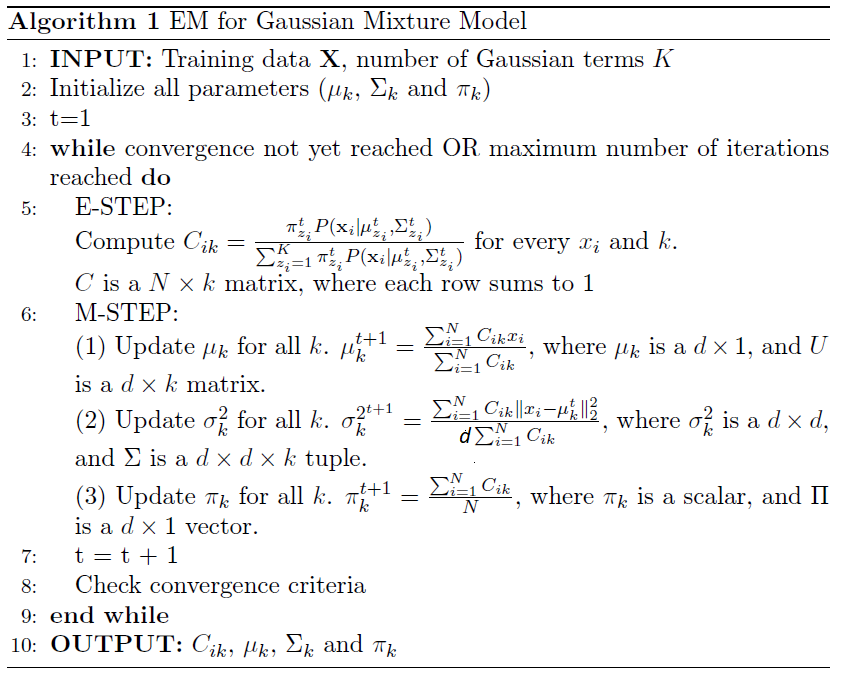

In [1]:
from IPython.display import Image
Image('figures/PseudoCode_EMforGMM.png',width=700)

## Discussions

* Does the EM algorithm find the **global minima**?

* Given a data set with an unknown number of groups/clusters, can you come up with a strategy for determining the "right" number of groups?

---

# Example: GMM as Density Estimation

Consider some data generated from Scikit-Learn's ```make_moons``` function:

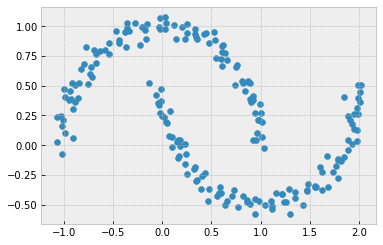

In [4]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('bmh')
from scipy import stats

from sklearn.datasets import make_moons
from matplotlib.patches import Ellipse

Xmoon, ymoon = make_moons(200, noise=.05, random_state=0)
plt.scatter(Xmoon[:, 0], Xmoon[:, 1]);

Let's create a helper function that will help us visualize the locations and shapes of the GMM clusters by drawing ellipses based on the GMM output. 

* Let's not worry about the implementation of this helper function.

In [5]:
# Code from "Python Data Science Handbook"
# https://jakevdp.github.io/PythonDataScienceHandbook/05.12-gaussian-mixtures.html

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
    
    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle, **kwargs))
        
def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)
    ax.axis('equal')
    
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * w_factor)

If we try to fit this with a two-component GMM viewed as a clustering model, the results are not particularly useful:

In [9]:
from sklearn.mixture import GaussianMixture

GaussianMixture?

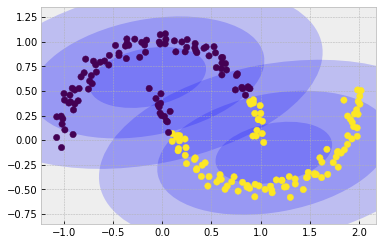

In [7]:
GMM = GaussianMixture(n_components=2, covariance_type='full', random_state=0).fit(Xmoon)
plot_gmm(GMM, Xmoon)

But if we instead use many more components and ignore the cluster labels, we find a fit that is much closer to the input data:

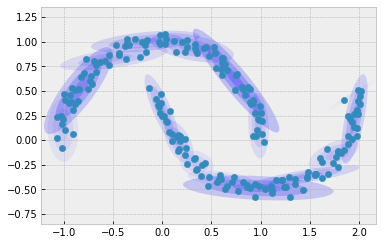

In [8]:
GMM16 = GaussianMixture(n_components=16, random_state=0).fit(Xmoon)
plot_gmm(GMM16, Xmoon, label=False)

Here the mixture of 16 Gaussians serves not to find separated clusters of data, but rather to model the overall distribution of the input data. This is a generative model of the distribution, meaning that the GMM gives us the recipe to generate new random data distributed similarly to our input. 

For example, here are 400 new points drawn from this 16-component GMM fit to our original data:

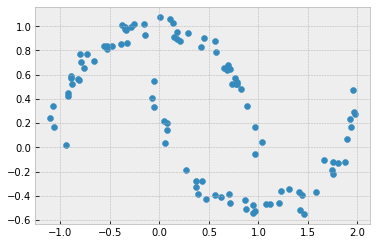

In [10]:
Xnew = GMM16.sample(100)
plt.scatter(Xnew[0][:, 0], Xnew[0][:, 1]);

GMM is convenient as a flexible means of modeling an arbitrary multi-dimensional distribution of data.

---

## Univariate Cases

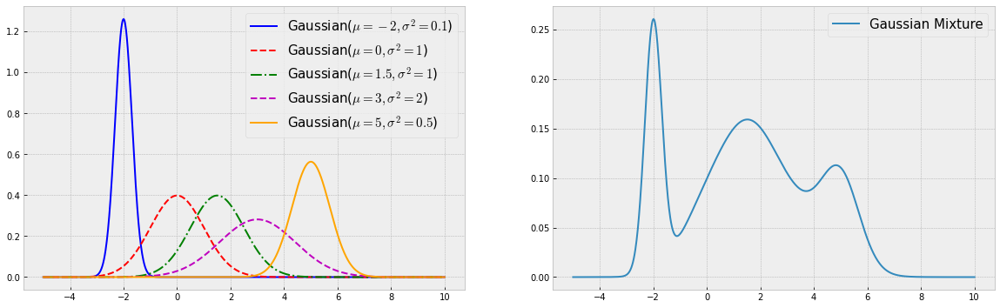

In [11]:
x=np.linspace(-5,10,1000)

mus = [-2, 0, 1.5, 3, 5]
sigs_sq = [0.1, 1, 1, 2, 0.5]
Pis = [.2, 0.15, .25, .25, .15]

symbols=['-b','--r','-.g','--m','orange']

mixture_density=0

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
for i in range(len(mus)):
    plt.plot(x, stats.norm(loc=mus[i], scale=np.sqrt(sigs_sq[i])).pdf(x),
             symbols[i],
             label='Gaussian($\mu='+str(mus[i])+',\sigma^2='+str(sigs_sq[i])+'$)')
    mixture_density += Pis[i]*stats.norm(loc=mus[i], scale=np.sqrt(sigs_sq[i])).pdf(x)
plt.legend(fontsize=15)
plt.subplot(1,2,2)
plt.plot(x, mixture_density, label='Gaussian Mixture')
plt.legend(fontsize=15);

In [12]:
def make_uni_GaussianMixture(N, mus, sigs_sq, Pis):
    X = np.empty(0)
    L = np.empty(0)
    for i in range(N):
        rv = np.random.uniform()   # sample uniform RV
        GaussianChosen = np.where(rv < np.cumsum(Pis))[0][0] # This selects the Gaussian label
        L = np.append(L, GaussianChosen)
        X = np.append(X, stats.norm(loc=mus[GaussianChosen], scale=np.sqrt(sigs_sq[GaussianChosen])).rvs(size=1))
    return X[:,np.newaxis], L

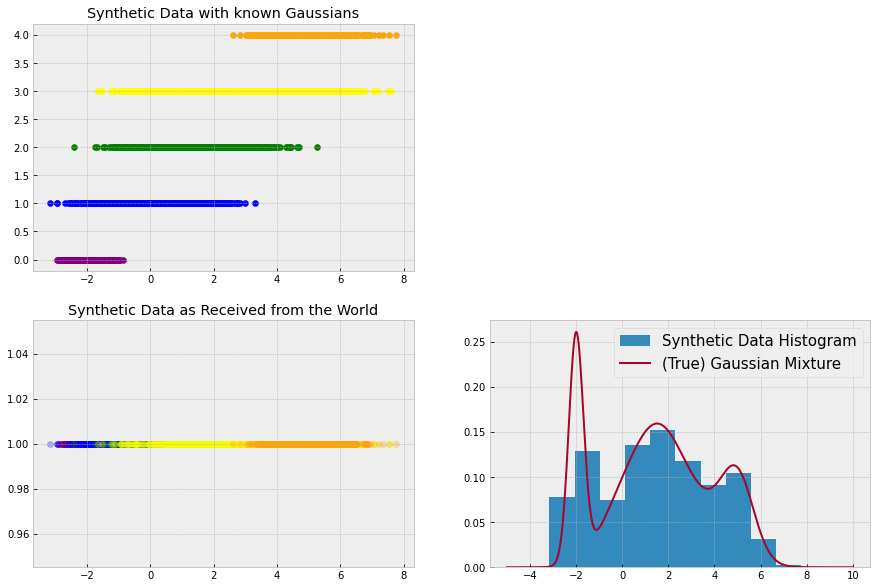

In [13]:
N = 10_000
mus = [-2, 0, 1.5, 3, 5]
sigs_sq = [0.1, 1, 1, 2, 0.5]
Pis = [.2, 0.15, .25, .25, .15]
colors=['purple','blue','green','yellow','orange']

data, L = make_uni_GaussianMixture(N, mus, sigs_sq, Pis)

fig = plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
for i in range(len(mus)):
    plt.scatter(data[L==i], i*np.ones(len(data[L==i])), c=colors[i])
plt.title('Synthetic Data with known Gaussians')
plt.subplot(2,2,3)
for i in range(len(mus)):
    plt.scatter(data[L==i], np.ones(len(data[L==i])), c=colors[i], alpha=0.3)
plt.title('Synthetic Data as Received from the World')
plt.subplot(2,2,4)
plt.hist(data, density=True, label='Synthetic Data Histogram')
plt.plot(x, mixture_density, label='(True) Gaussian Mixture')
plt.legend(fontsize=15);

## Building a Function to Train and Plot a GMM Density Estimation with the EM Algorithm

In [14]:
def GMM_predict_plot(X,T,Nclusters,d=1,init_parms='kmeans',covariance_type='full',plotting=True):
    if init_parms == 'random':
        # select points at random from dataset
        N, D = X.shape
        index_loc=np.random.randint(0,N,size=Nclusters)
        means_init = X[index_loc,:]
        GMM = GaussianMixture(n_components=Nclusters,
                          covariance_type=covariance_type,
                              init_params=init_parms,
                             means_init=means_init).fit(X)
    else:
        GMM = GaussianMixture(n_components=Nclusters,
                              covariance_type=covariance_type,
                              init_params=init_parms).fit(X)
    labels = GMM.predict(X)
    prob = GMM.predict_proba(X).round(2)
    # Estimated parameters
    Means=GMM.means_
    Sigmas=GMM.covariances_
    Pis=GMM.weights_

    if plotting:
        if d==2:
            plt.figure(figsize=(5,5))
            plt.scatter(X[:,0],X[:,1], c=T)
            plt.title('True (Unknown) Labels');

            fig = plt.figure(figsize=(15,10))
            fig.add_subplot(2,Nclusters,1)
            plt.scatter(X[:,0],X[:,1], c=labels)
            plt.title('Predicted Labels by GMM');
            for i in range(Nclusters):
                ax = fig.add_subplot(2,Nclusters,Nclusters+i+1)
                p1 = ax.scatter(X[:,0], X[:,1], c=prob[:,i])
                fig.colorbar(p1, ax=ax)
                plt.title('Memberships\n Cluster '+str(i+1))
        else: #d===1
            plt.figure(figsize=(5,5))
            plt.scatter(X, np.ones(len(X)), c=T)
            plt.title('True (Unknown) Labels');

            fig = plt.figure(figsize=(15,10))
            fig.add_subplot(2,Nclusters,1)
            plt.scatter(X, np.ones(len(X)), c=labels)
            plt.title('Predicted Labels by GMM');
            for i in range(Nclusters):
                ax = fig.add_subplot(2,Nclusters,Nclusters+i+1)
                p1 = ax.scatter(X, np.ones(len(X)), c=prob[:,i])
                fig.colorbar(p1, ax=ax)
                plt.title('Memberships\n Cluster '+str(i+1))
            
    return Means, Sigmas, Pis

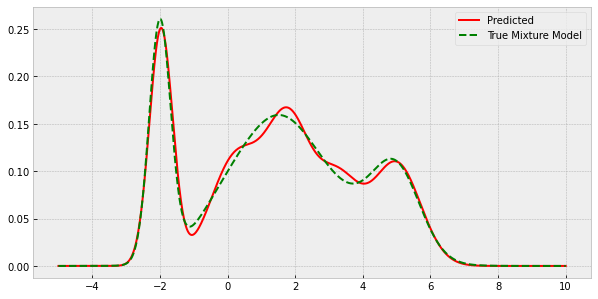

In [30]:
n_components = 5 #K

Means, Sigmas, Pis=GMM_predict_plot(data,L,n_components, d=1,
                                    init_parms='kmeans',
                                    covariance_type='full',
                                    plotting=False);

plt.figure(figsize=(10,5))
x=np.linspace(-5,10,1000)
estimated_mixture=0
for i in range(len(Pis)):
    estimated_mixture += Pis[i]*stats.norm(loc=Means[i], scale=np.sqrt(Sigmas[i][0])).pdf(x)
plt.plot(x, estimated_mixture, 'r', label='Predicted')
plt.plot(x, mixture_density, '--g', label='True Mixture Model')
plt.legend();

---

# Example: GMM as a Clustering Algorithm

GMM is commonly used as an algorithm for density estimation. That is to say, the result of a GMM fit to some data is technically not a clustering model, but a generative probabilistic model describing the distribution of the data.

However, a common practical use for the GMM is as a clustering algorithm, where we are interested in finding groups in the data.

To illustrate this, I will use the ```scikit-learn``` algorithm implementation of the GMM model:

In [33]:
from sklearn import datasets

# Create synthetically generate data
n_samples = 1500
X1, T1 = datasets.make_blobs(n_samples=n_samples,centers=3,cluster_std=1)               # Blobs data
X2, T2 = datasets.make_blobs(n_samples=n_samples,cluster_std=[1.0, 2.5, 0.5],centers=3) # Different Variance Blobs data
X3, T3 = datasets.make_moons(n_samples=n_samples, noise=.05)                            # Moons data
X4, T4 = datasets.make_circles(n_samples, noise=.05, factor=0.5)                        # Circles data
X5     = np.dot(X1, [[0.60834549, -0.63667341], [-0.40887718, 0.85253229]])             # Anisotropicly distributed data
T5     = T1
X6     = np.vstack((X1[T1 == 0][:500], X1[T1 == 1][:100], X1[T1 == 2][:10]))            # Unevenly sized Blobs data
T6     = np.hstack((np.zeros(500),np.ones(100),2*np.ones(10))).astype('int')

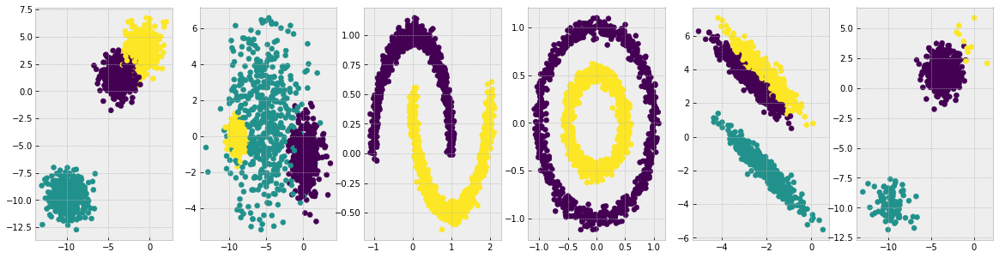

In [34]:
plt.figure(figsize=(20,5))
plt.subplot(1,6,1); plt.scatter(X1[:,0],X1[:,1],c=T1)
plt.subplot(1,6,2); plt.scatter(X2[:,0],X2[:,1],c=T2)
plt.subplot(1,6,3); plt.scatter(X3[:,0],X3[:,1],c=T3)
plt.subplot(1,6,4); plt.scatter(X4[:,0],X4[:,1],c=T4)
plt.subplot(1,6,5); plt.scatter(X5[:,0],X5[:,1],c=T5)
plt.subplot(1,6,6); plt.scatter(X6[:,0],X6[:,1],c=T6);

In [35]:
plt.rcParams['axes.grid'] = False

def GMM_predict_plot(X,T,Nclusters,init_parms='kmeans',covariance_type='full'):
    
    N, D = X.shape
    
    # select mean values as random samples from dataset X
    if init_parms == 'random':
        index_loc=np.random.randint(0,N,size=Nclusters)
        means_init = X[index_loc,:]
        
        GMM = GaussianMixture(n_components=Nclusters,
                          covariance_type=covariance_type,
                              init_params=init_parms,
                             means_init=means_init).fit(X)
    
    # otherwise, initialize with k-means clustering solution
    else:
        GMM = GaussianMixture(n_components=Nclusters,
                              covariance_type=covariance_type,
                              init_params=init_parms).fit(X)
    labels = GMM.predict(X)
    prob = GMM.predict_proba(X).round(2)

    plt.figure(figsize=(5,5))
    plt.grid(True)
    plt.scatter(X[:,0],X[:,1], c=T)
    plt.title('True (Unknown) Labels');
    
    fig = plt.figure(figsize=(15,10))
    fig.add_subplot(2,Nclusters,1)
    plt.scatter(X[:,0],X[:,1], c=labels)
    plt.grid(True)
    plt.title('Predicted Labels by GMM');
    for i in range(Nclusters):
        ax = fig.add_subplot(2,Nclusters,Nclusters+i+1)
        p1 = ax.scatter(X[:,0], X[:,1], c=prob[:,i])
        fig.colorbar(p1, ax=ax)
        plt.title('Memberships in Cluster '+str(i+1))
        plt.grid(True)

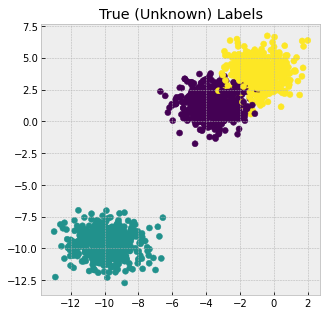

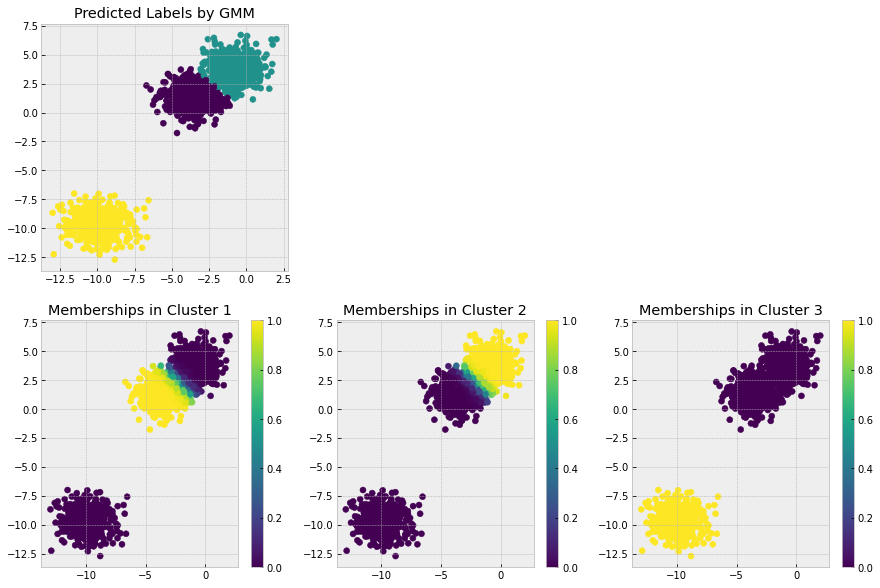

In [37]:
GMM_predict_plot(X1,T1,3,init_parms='random',covariance_type='diag');

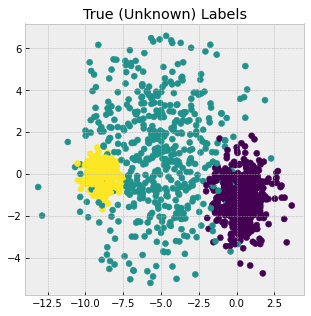

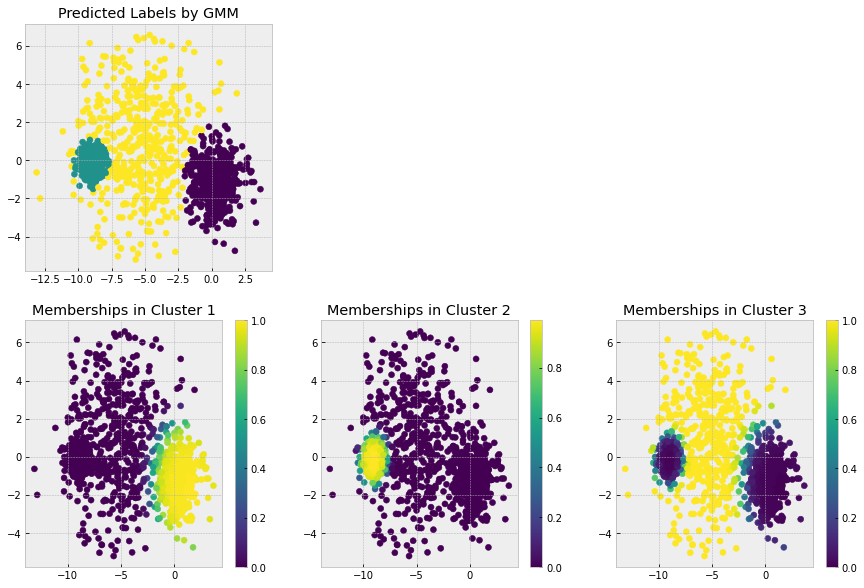

In [38]:
GMM_predict_plot(X2,T2,3)

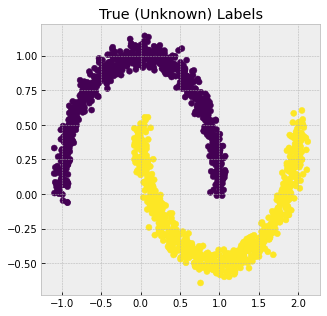

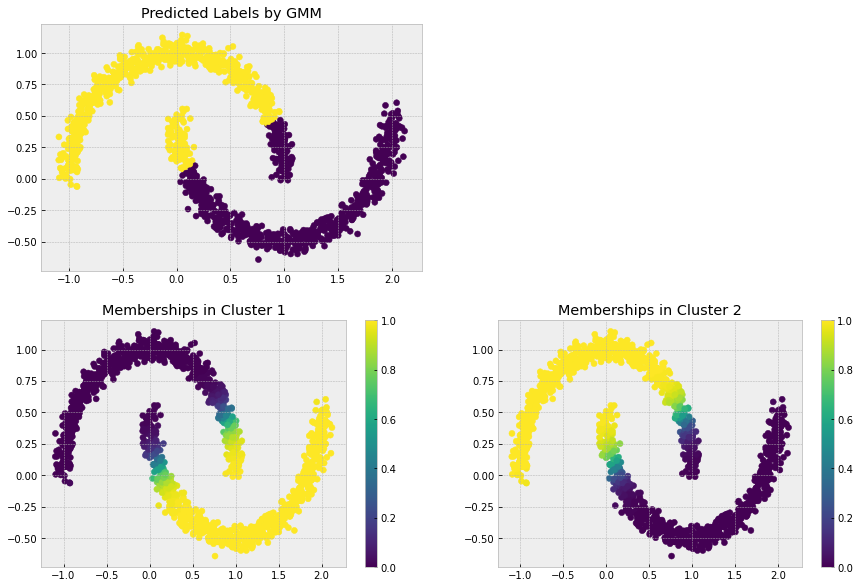

In [39]:
GMM_predict_plot(X3,T3,2)

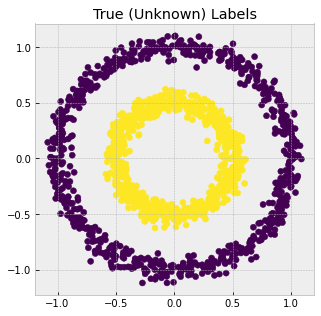

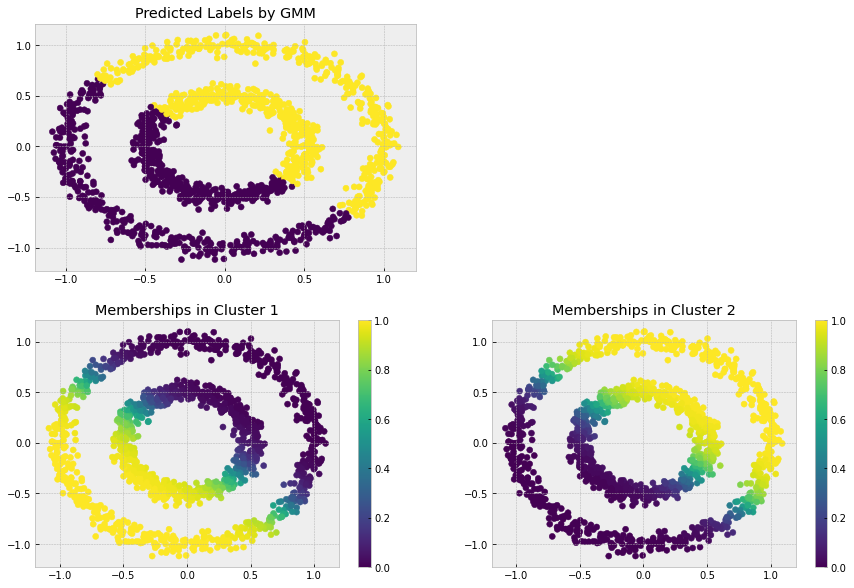

In [40]:
GMM_predict_plot(X4,T4,2)

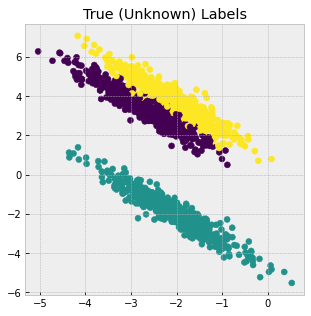

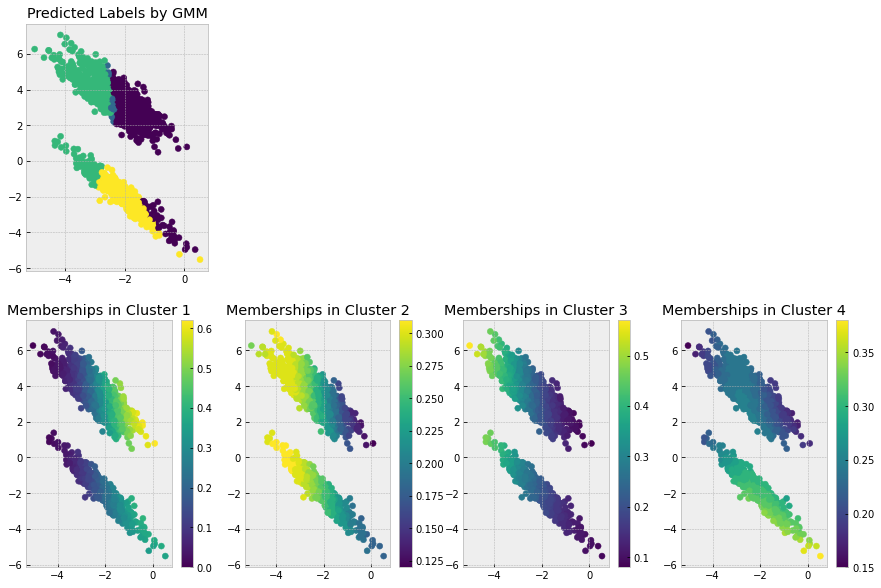

In [50]:
GMM_predict_plot(X5,T5,4,init_parms='random',covariance_type='full')

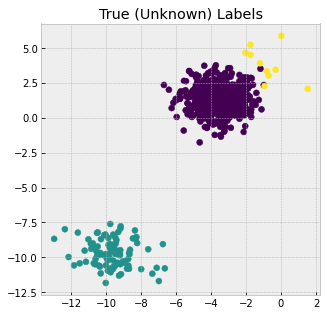

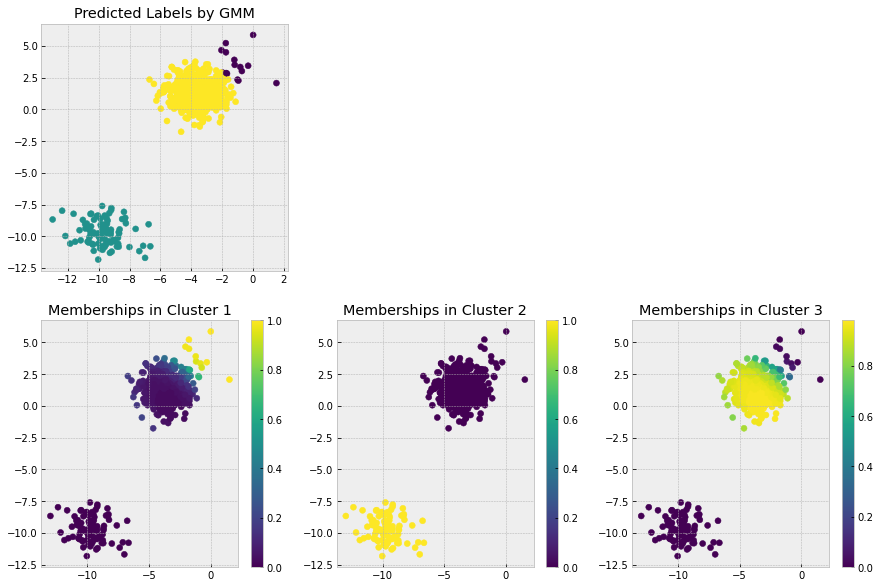

In [53]:
GMM_predict_plot(X6,T6,3,init_parms='random')

___

## Interactive Visualizations with Code from Scratch

(This code will be shared after upcoming assignment solutions are posted.)

### Interactive Code (from scratch)

In [54]:
# (This code will be shared after upcoming assignment solutions are posted.)



### Running Interactice Code on Synthetic Data

In [55]:
colors=np.array(['magenta','orange','blue','green','red','cyan'])

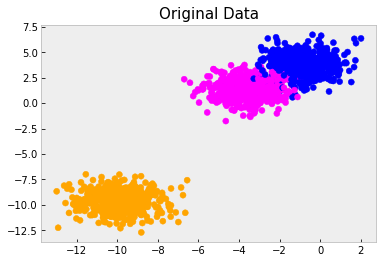

Iteration t=0
Component:  1 , Pi:  0.3333333333333333 , Mean:  [-4.59586302  2.06013221] , Sigma:  [[0.5 0. ]
 [0.  0.5]]
Component:  2 , Pi:  0.3333333333333333 , Mean:  [-4.87001064  2.89998341] , Sigma:  [[0.5 0. ]
 [0.  0.5]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-10.04994156 -11.34756261] , Sigma:  [[0.5 0. ]
 [0.  0.5]]


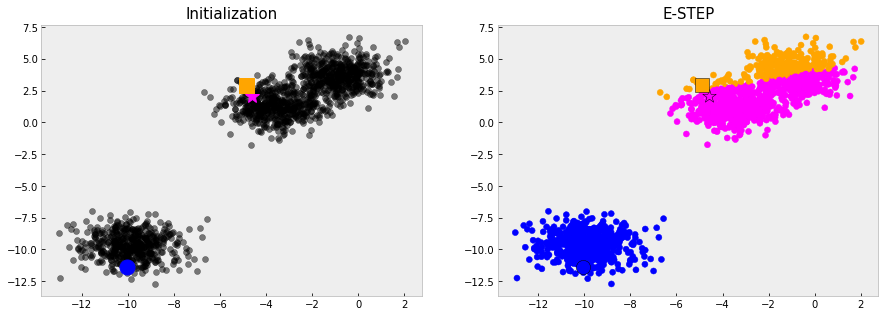

t =  1 : 	 21.551836107268528
Component:  1 , Pi:  0.45686078250355533 , Mean:  [-2.49776547  1.88338581] , Sigma:  [[2.86442508 1.43962182]
 [1.43962182 1.72557482]]
Component:  2 , Pi:  0.2098058841631121 , Mean:  [-1.70698498  3.81785387] , Sigma:  [[2.58962537 1.16415997]
 [1.16415997 1.42454746]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


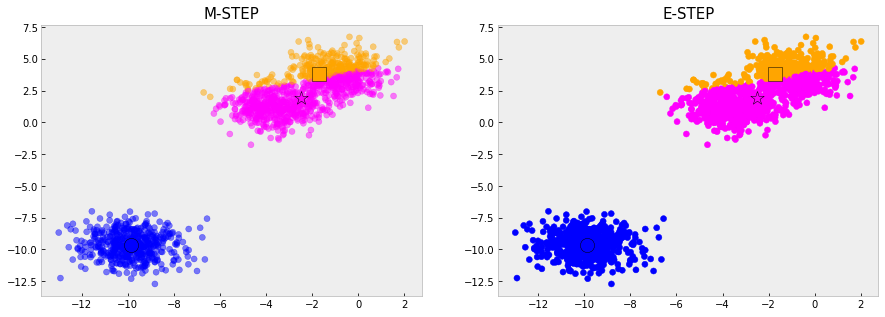

t =  2 : 	 0.499215807868981
Component:  1 , Pi:  0.45646182653706296 , Mean:  [-2.52229606  1.87840963] , Sigma:  [[2.87174487 1.43676399]
 [1.43676399 1.74295718]]
Component:  2 , Pi:  0.2102048401357715 , Mean:  [-1.65521742  3.8249882 ] , Sigma:  [[2.48720496 1.06156645]
 [1.06156645 1.35256348]]
Component:  3 , Pi:  0.3333333333271654 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


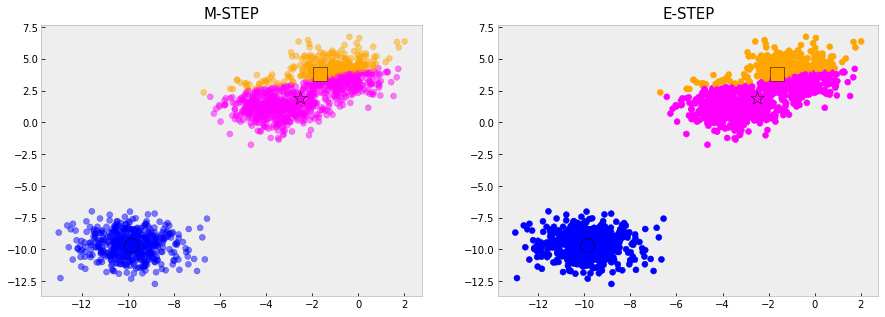

t =  3 : 	 0.560029358860288
Component:  1 , Pi:  0.45652288420419973 , Mean:  [-2.55413305  1.86956353] , Sigma:  [[2.86340251 1.41074332]
 [1.41074332 1.73372594]]
Component:  2 , Pi:  0.21014378247021734 , Mean:  [-1.58580183  3.84477131] , Sigma:  [[2.37803682 0.96421444]
 [0.96421444 1.2960251 ]]
Component:  3 , Pi:  0.3333333333255825 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


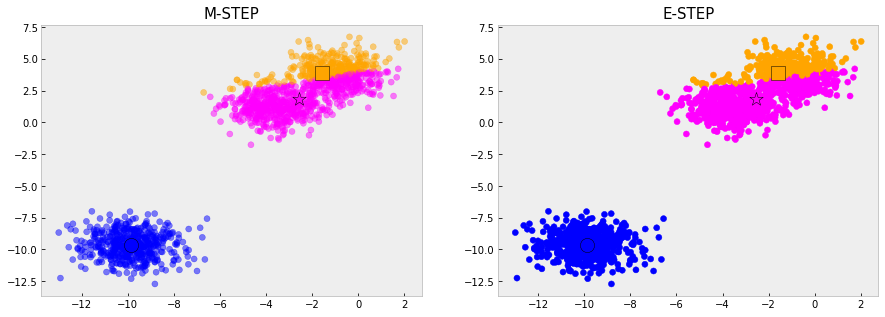

t =  4 : 	 0.7138462283747806
Component:  1 , Pi:  0.4566189787516496 , Mean:  [-2.59327409  1.857054  ] , Sigma:  [[2.84751431 1.37157429]
 [1.37157429 1.71197317]]
Component:  2 , Pi:  0.210047687922036 , Mean:  [-1.50027079  3.8728692 ] , Sigma:  [[2.2364921  0.85041677]
 [0.85041677 1.23276967]]
Component:  3 , Pi:  0.3333333333263136 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


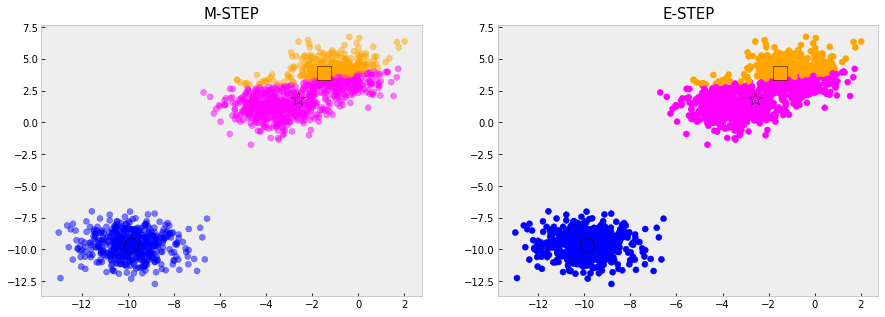

t =  5 : 	 0.9072311109011302
Component:  1 , Pi:  0.4565465626609211 , Mean:  [-2.64116305  1.84046479] , Sigma:  [[2.82164518 1.31868249]
 [1.31868249 1.68009396]]
Component:  2 , Pi:  0.21012010401120165 , Mean:  [-1.39659492  3.90821931] , Sigma:  [[2.05013128 0.71173943]
 [0.71173943 1.15643497]]
Component:  3 , Pi:  0.33333333332787707 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


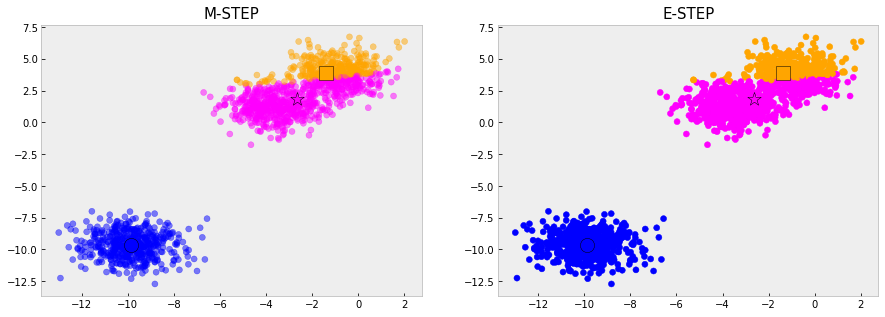

t =  6 : 	 1.12945635602909
Component:  1 , Pi:  0.45601192630123677 , Mean:  [-2.69952589  1.81915716] , Sigma:  [[2.7780654  1.24817874]
 [1.24817874 1.63775613]]
Component:  2 , Pi:  0.21065474036913617 , Mean:  [-1.27341344  3.94909679] , Sigma:  [[1.81333418 0.54605927]
 [0.54605927 1.06685988]]
Component:  3 , Pi:  0.33333333332962717 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


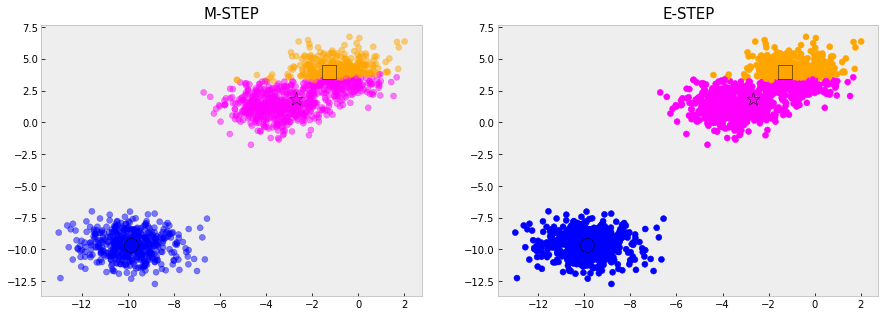

t =  7 : 	 1.3316708082565898
Component:  1 , Pi:  0.4544315612370342 , Mean:  [-2.76939242  1.79245797] , Sigma:  [[2.70455281 1.1557002 ]
 [1.1557002  1.58489621]]
Component:  2 , Pi:  0.2122351054317764 , Mean:  [-1.13443654  3.99040416] , Sigma:  [[1.53661689 0.36202518]
 [0.36202518 0.97131484]]
Component:  3 , Pi:  0.3333333333311895 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


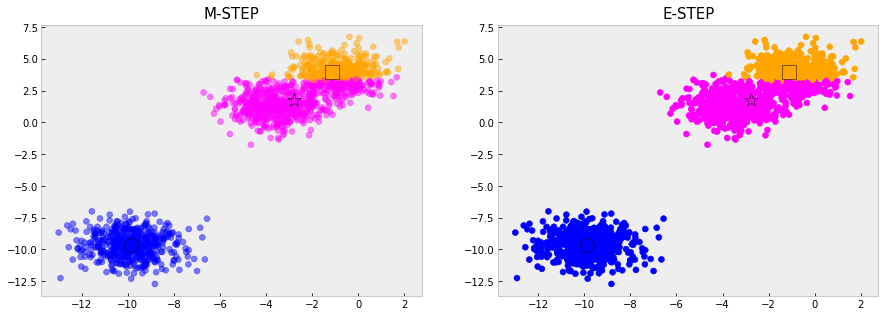

t =  8 : 	 1.4103298064648144
Component:  1 , Pi:  0.4508154053391153 , Mean:  [-2.84965214  1.75978075] , Sigma:  [[2.58817291 1.04083336]
 [1.04083336 1.52384982]]
Component:  2 , Pi:  0.21585126132857174 , Mean:  [-0.99420079  4.02182987] , Sigma:  [[1.26278779 0.18552886]
 [0.18552886 0.88679746]]
Component:  3 , Pi:  0.3333333333323136 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


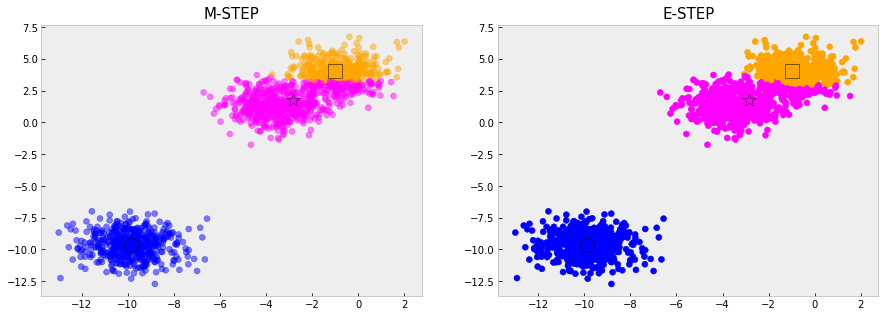

t =  9 : 	 1.2680050861042642
Component:  1 , Pi:  0.44423194379755887 , Mean:  [-2.93569899  1.72131098] , Sigma:  [[2.425386   0.91271606]
 [0.91271606 1.46060473]]
Component:  2 , Pi:  0.2224347228695039 , Mean:  [-0.87727001  4.03170866] , Sigma:  [[1.06284988 0.05188873]
 [0.05188873 0.83277026]]
Component:  3 , Pi:  0.33333333333293685 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


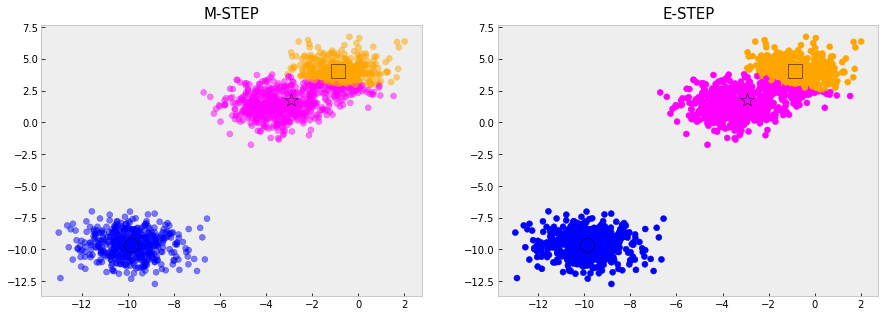

t =  10 : 	 1.0196394568562355
Component:  1 , Pi:  0.4350832421414492 , Mean:  [-3.02134244  1.67956092] , Sigma:  [[2.23289022 0.78590974]
 [0.78590974 1.40143005]]
Component:  2 , Pi:  0.2315834245253537 , Mean:  [-0.79768712  4.0188736 ] , Sigma:  [[ 0.96319208 -0.02689086]
 [-0.02689086  0.81373972]]
Component:  3 , Pi:  0.3333333333331973 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


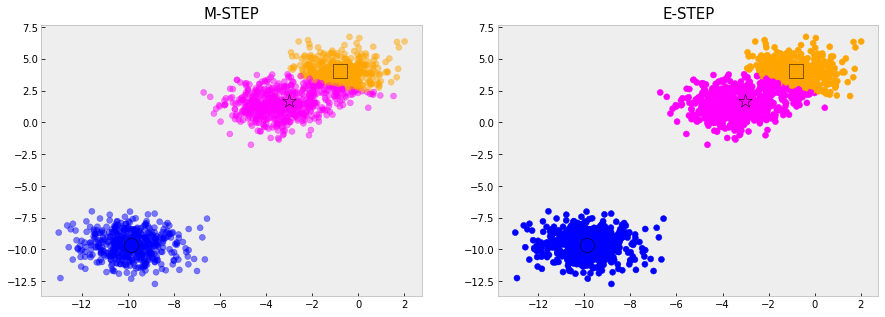

t =  11 : 	 0.8294205572654515
Component:  1 , Pi:  0.4246060589070605 , Mean:  [-3.10300432  1.63653002] , Sigma:  [[2.03680415 0.66683035]
 [0.66683035 1.34473934]]
Component:  2 , Pi:  0.24206060775965207 , Mean:  [-0.75068863  3.99310226] , Sigma:  [[ 0.92516553 -0.06557183]
 [-0.06557183  0.81841923]]
Component:  3 , Pi:  0.3333333333332864 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


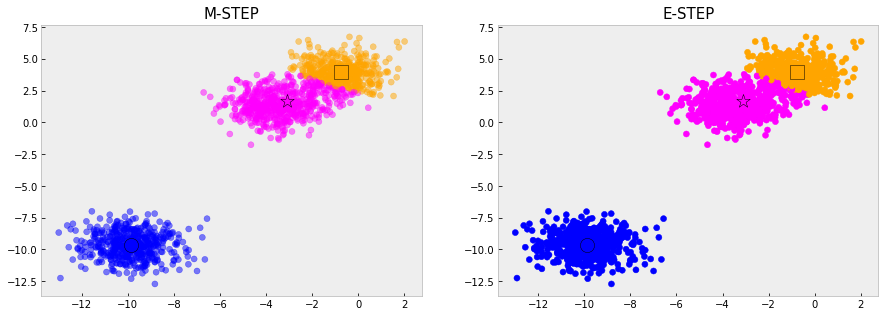

t =  12 : 	 0.7185989217810242
Component:  1 , Pi:  0.41348926408124553 , Mean:  [-3.17994998  1.5918617 ] , Sigma:  [[1.85613805 0.55509887]
 [0.55509887 1.28588893]]
Component:  2 , Pi:  0.25317740258543786 , Mean:  [-0.72830908  3.96257956] , Sigma:  [[ 0.91061627 -0.080209  ]
 [-0.080209    0.83346526]]
Component:  3 , Pi:  0.33333333333331683 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


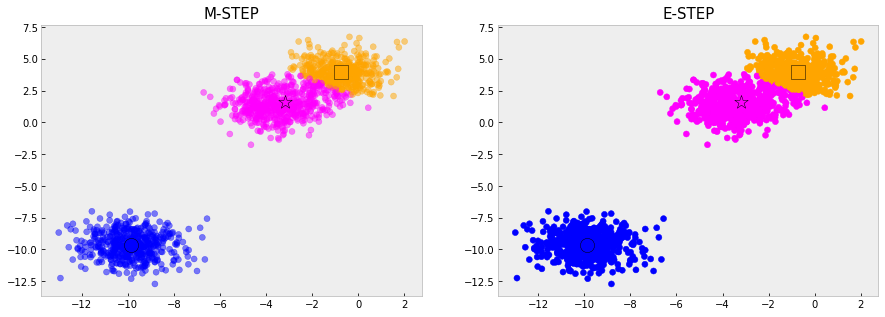

t =  13 : 	 0.6282507497264636
Component:  1 , Pi:  0.4020934923332706 , Mean:  [-3.25199856  1.54571929] , Sigma:  [[1.69979813 0.4518623 ]
 [0.4518623  1.22536887]]
Component:  2 , Pi:  0.26457317433340116 , Mean:  [-0.72440874  3.9305937 ] , Sigma:  [[ 0.90302793 -0.08204684]
 [-0.08204684  0.85025016]]
Component:  3 , Pi:  0.3333333333333281 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


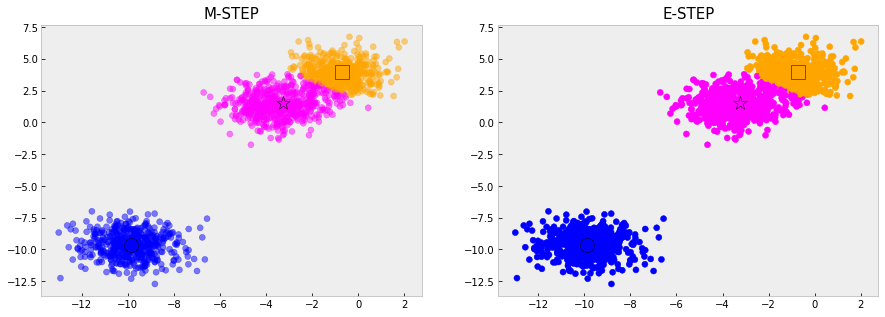

t =  14 : 	 0.5849987699990793
Component:  1 , Pi:  0.3908658163618288 , Mean:  [-3.31869387  1.49959383] , Sigma:  [[1.56742165 0.35802092]
 [0.35802092 1.16546464]]
Component:  2 , Pi:  0.27580085030483925 , Mean:  [-0.73278451  3.89887614] , Sigma:  [[ 0.89895475 -0.07719616]
 [-0.07719616  0.86614148]]
Component:  3 , Pi:  0.33333333333333187 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


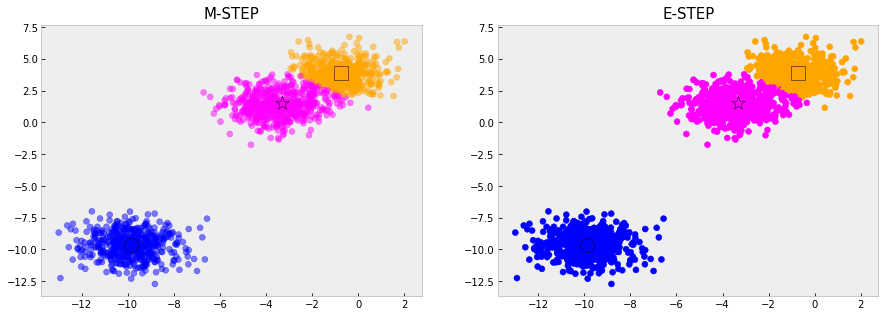

t =  15 : 	 0.5419487626162168
Component:  1 , Pi:  0.38027634614234995 , Mean:  [-3.37926129  1.45552839] , Sigma:  [[1.45544228 0.27391599]
 [0.27391599 1.10846311]]
Component:  2 , Pi:  0.2863903205243163 , Mean:  [-0.74797725  3.86867231] , Sigma:  [[ 0.89857955 -0.06828282]
 [-0.06828282  0.88148923]]
Component:  3 , Pi:  0.33333333333333304 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


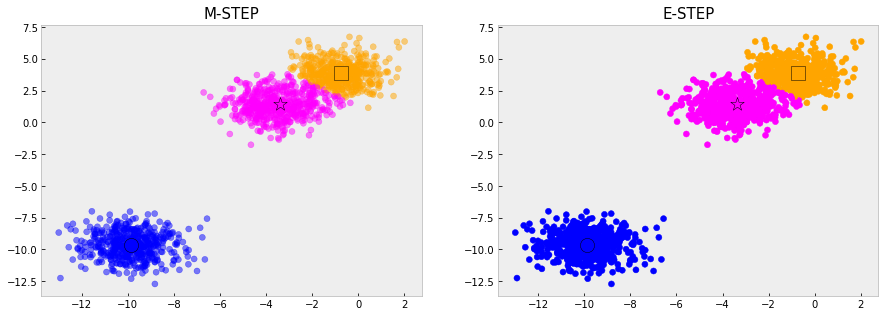

t =  16 : 	 0.4927971547785097
Component:  1 , Pi:  0.37067458923318086 , Mean:  [-3.43284847  1.41544359] , Sigma:  [[1.36152726 0.20065546]
 [0.20065546 1.05714138]]
Component:  2 , Pi:  0.29599207743348527 , Mean:  [-0.76622619  3.84059047] , Sigma:  [[ 0.90176376 -0.05668927]
 [-0.05668927  0.89695096]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


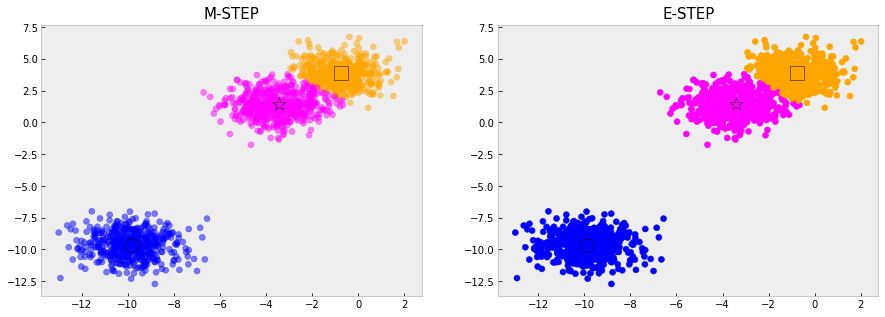

t =  17 : 	 0.4331992525033819
Component:  1 , Pi:  0.3622748154411447 , Mean:  [-3.47879202  1.38074564] , Sigma:  [[1.28451484 0.13944761]
 [0.13944761 1.01385776]]
Component:  2 , Pi:  0.3043918512255219 , Mean:  [-0.78513219  3.81496398] , Sigma:  [[ 0.90784234 -0.04339368]
 [-0.04339368  0.91279519]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


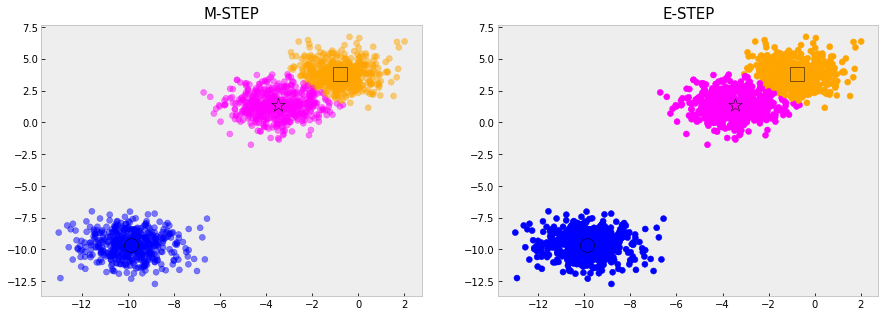

t =  18 : 	 0.36750770809998556
Component:  1 , Pi:  0.35516314078163397 , Mean:  [-3.51688227  1.35207585] , Sigma:  [[1.22329135 0.09060782]
 [0.09060782 0.97960242]]
Component:  2 , Pi:  0.3115035258850322 , Mean:  [-0.80319998  3.79207848] , Sigma:  [[ 0.91595144 -0.02926254]
 [-0.02926254  0.92883643]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


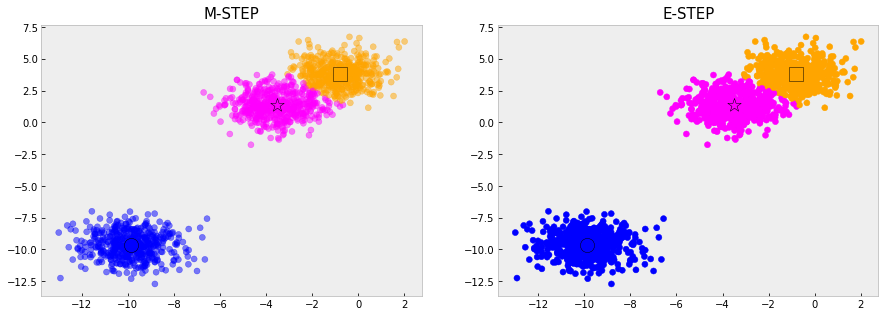

t =  19 : 	 0.30241188256297213
Component:  1 , Pi:  0.3493061549095476 , Mean:  [-3.54751233  1.32927762] , Sigma:  [[1.1761136  0.05319957]
 [0.05319957 0.95385856]]
Component:  2 , Pi:  0.31736051175711916 , Mean:  [-0.81956853  3.77214059] , Sigma:  [[ 0.92518146 -0.01512691]
 [-0.01512691  0.94456022]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


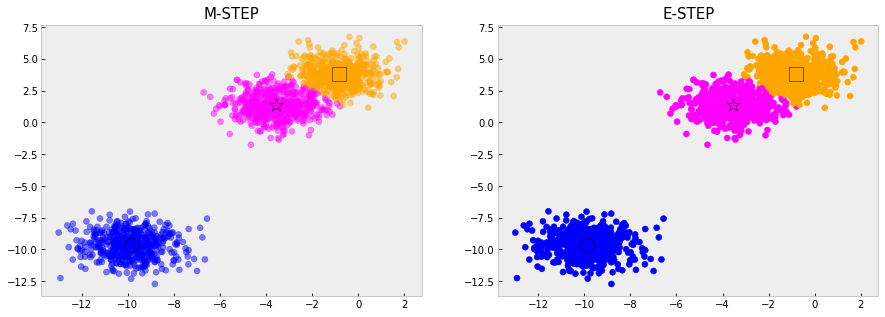

t =  20 : 	 0.24340311768177914
Component:  1 , Pi:  0.3445804976614283 , Mean:  [-3.57158699  1.31162222] , Sigma:  [[1.14061155 0.02536606]
 [0.02536606 0.93515387]]
Component:  2 , Pi:  0.3220861690052383 , Mean:  [-0.83383697  3.75518728] , Sigma:  [[ 0.9346835  -0.00171444]
 [-0.00171444  0.95935948]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


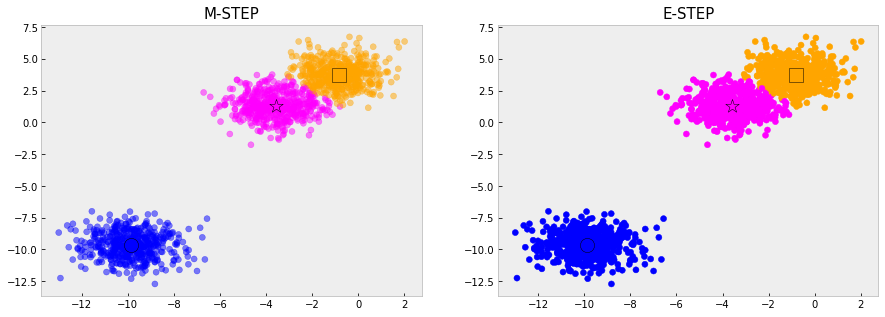

t =  21 : 	 0.19329983074976692
Component:  1 , Pi:  0.3408171988748596 , Mean:  [-3.59025893  1.29814317] , Sigma:  [[1.11422279 0.00495901]
 [0.00495901 0.9217692 ]]
Component:  2 , Pi:  0.3258494677918072 , Mean:  [-0.84592615  3.74106428] , Sigma:  [[0.94378185 0.01045212]
 [0.01045212 0.97275053]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


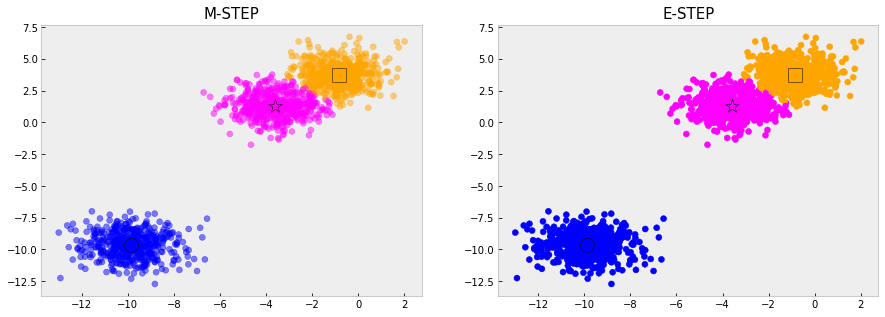

t =  22 : 	 0.15251097766687788
Component:  1 , Pi:  0.3378409456561091 , Mean:  [-3.60466898  1.28789852] , Sigma:  [[ 1.09463721 -0.00996792]
 [-0.00996792  0.91219666]]
Component:  2 , Pi:  0.3288257210105576 , Mean:  [-0.85596042  3.72947853] , Sigma:  [[0.95204024 0.02109805]
 [0.02109805 0.98447207]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


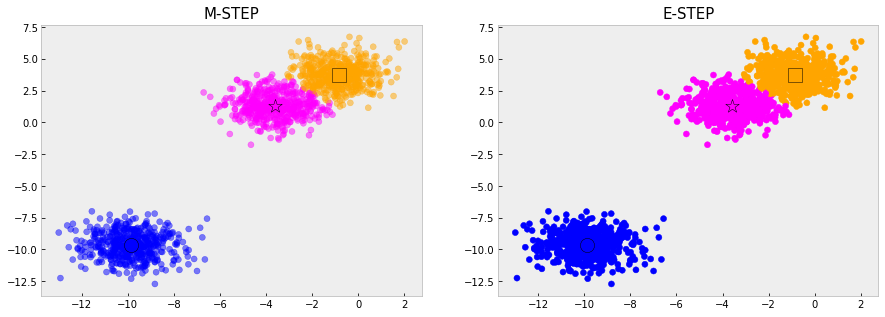

t =  23 : 	 0.12007894814383052
Component:  1 , Pi:  0.33549342046352787 , Mean:  [-3.61579746  1.28009781] , Sigma:  [[ 1.08001481 -0.02095109]
 [-0.02095109  0.90529124]]
Component:  2 , Pi:  0.3311732462031388 , Mean:  [-0.86417102  3.72007383] , Sigma:  [[0.95925191 0.03016439]
 [0.03016439 0.99447297]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


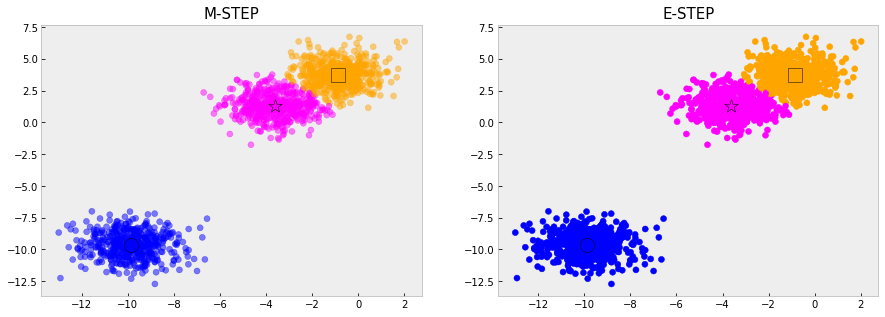

t =  24 : 	 0.09457878882211264
Component:  1 , Pi:  0.3336420951578629 , Mean:  [-3.62442287  1.27412768] , Sigma:  [[ 1.06899407 -0.02911446]
 [-0.02911446  0.90024511]]
Component:  2 , Pi:  0.33302457150880366 , Mean:  [-0.87082625  3.71249091] , Sigma:  [[0.96538037 0.03773724]
 [0.03773724 1.00284763]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-9.86158888 -9.66512877] , Sigma:  [[ 1.16714012 -0.03994478]
 [-0.03994478  1.01948864]]


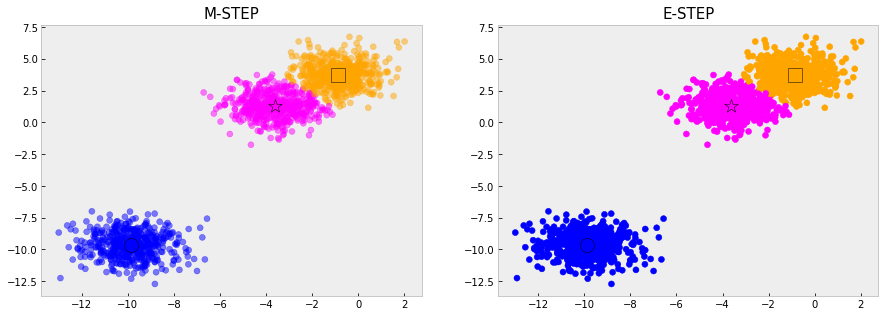

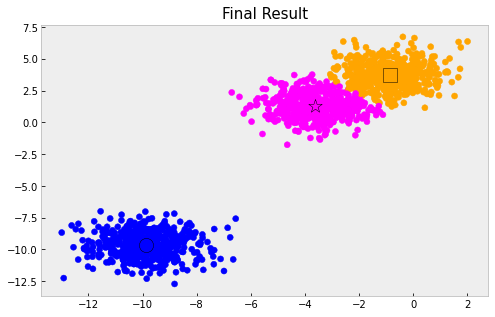

In [57]:
NumComponents = 3 #K
plt.scatter(X1[:,0],X1[:,1],c=colors[T1])
plt.title('Original Data',size=15);plt.show()

EM_Means, EM_Sigs, EM_Ps, pZ_X = EM_GaussianMixture(X1, NumComponents,50,0.1, display=True)

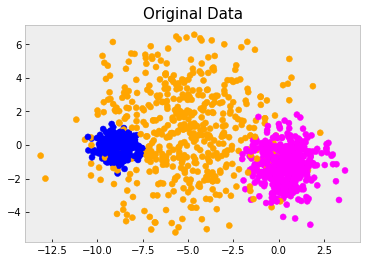

Iteration t=0
Component:  1 , Pi:  0.3333333333333333 , Mean:  [-9.58855834  0.06267758] , Sigma:  [[0.5 0. ]
 [0.  0.5]]
Component:  2 , Pi:  0.3333333333333333 , Mean:  [-7.92484928  0.17280511] , Sigma:  [[0.5 0. ]
 [0.  0.5]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-7.23537514 -0.88586075] , Sigma:  [[0.5 0. ]
 [0.  0.5]]


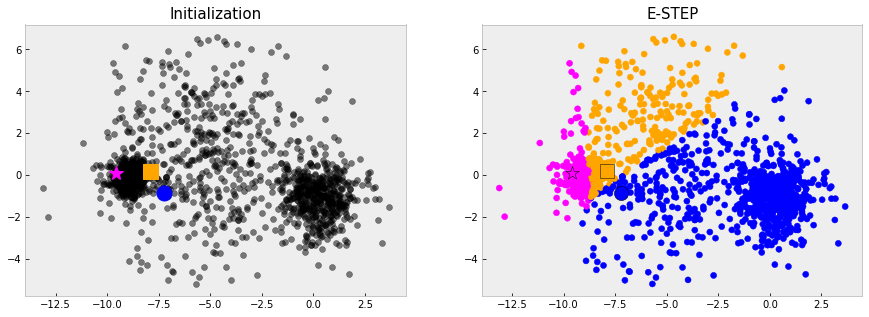

t =  1 : 	 30.944833959443137
Component:  1 , Pi:  0.2144538495068667 , Mean:  [-9.18704652e+00  1.40651968e-03] , Sigma:  [[0.29453407 0.01338711]
 [0.01338711 0.82487546]]
Component:  2 , Pi:  0.2478394347442399 , Mean:  [-7.14149489  1.48881157] , Sigma:  [[3.88710166 2.63660813]
 [2.63660813 3.7826263 ]]
Component:  3 , Pi:  0.5377067157488928 , Mean:  [-1.58628979 -0.92054721] , Sigma:  [[ 8.73867139 -0.04344969]
 [-0.04344969  1.96454105]]


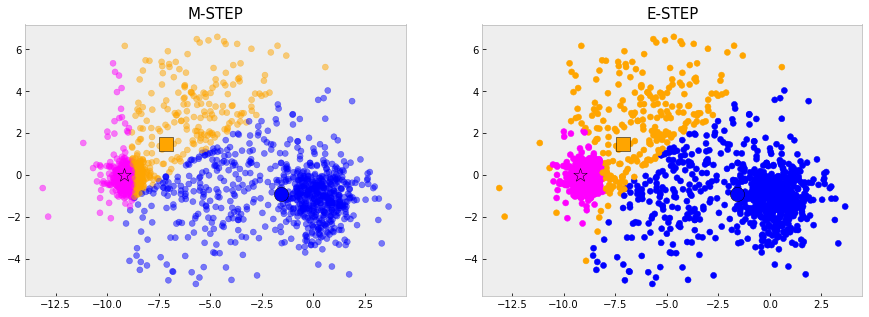

t =  2 : 	 5.338646540158675
Component:  1 , Pi:  0.2784578783340998 , Mean:  [-8.98667686 -0.10259771] , Sigma:  [[0.19132342 0.00125562]
 [0.00125562 0.34335096]]
Component:  2 , Pi:  0.21246538196214154 , Mean:  [-6.88589778  1.76772648] , Sigma:  [[4.41672336 2.53219828]
 [2.53219828 4.47636654]]
Component:  3 , Pi:  0.5090767397037586 , Mean:  [-1.23296608 -0.92855962] , Sigma:  [[ 6.85684066 -0.02249372]
 [-0.02249372  2.01003505]]


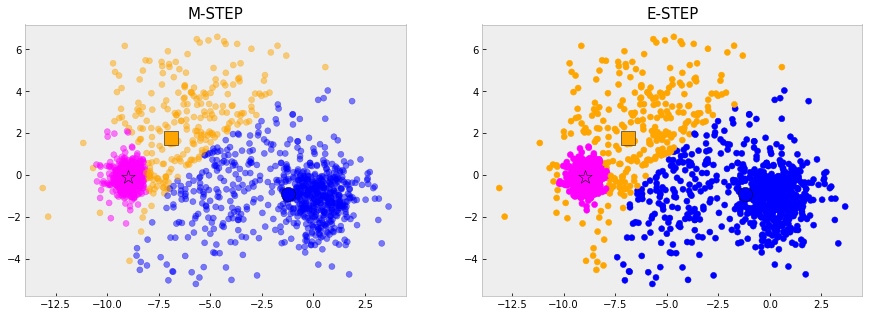

t =  3 : 	 3.7582118370953164
Component:  1 , Pi:  0.3116270599197401 , Mean:  [-8.93273497 -0.13476154] , Sigma:  [[0.17717254 0.01215729]
 [0.01215729 0.22369479]]
Component:  2 , Pi:  0.2001435104536145 , Mean:  [-6.58568151  1.90414925] , Sigma:  [[4.75420399 2.21829514]
 [2.21829514 4.96375814]]
Component:  3 , Pi:  0.4882294296266462 , Mean:  [-1.00636471 -0.95202032] , Sigma:  [[ 5.67603862e+00 -1.16856093e-03]
 [-1.16856093e-03  1.92270964e+00]]


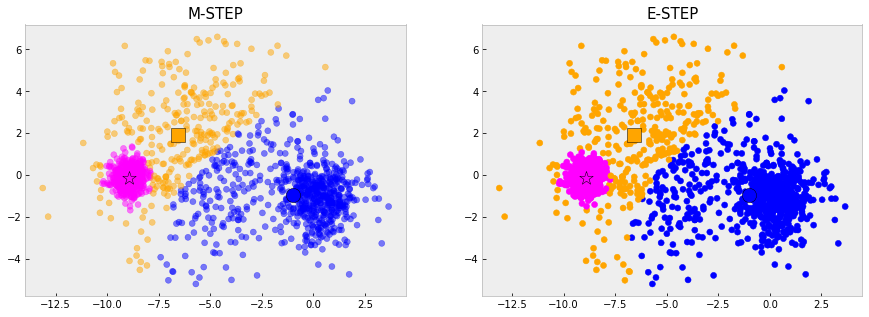

t =  4 : 	 2.592226096315465
Component:  1 , Pi:  0.3186530127128212 , Mean:  [-8.92174974 -0.13686723] , Sigma:  [[0.18118693 0.01509943]
 [0.01509943 0.20823639]]
Component:  2 , Pi:  0.21324613761248037 , Mean:  [-6.41683235  1.763603  ] , Sigma:  [[4.86197553 2.02114539]
 [2.02114539 5.44855851]]
Component:  3 , Pi:  0.4681008496746994 , Mean:  [-0.81562142 -0.97877399] , Sigma:  [[ 4.84563464 -0.01086945]
 [-0.01086945  1.77275824]]


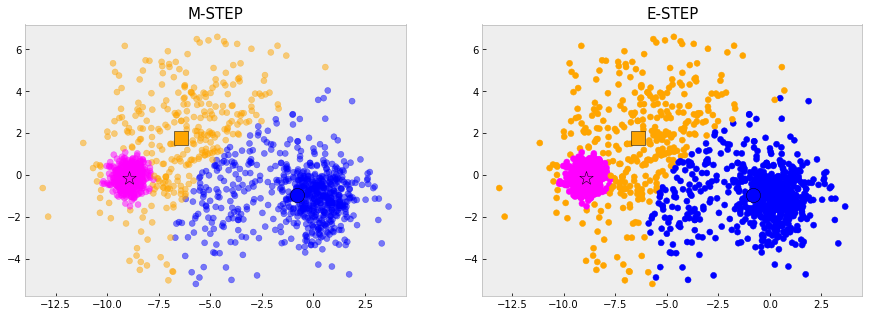

t =  5 : 	 2.5815678212359097
Component:  1 , Pi:  0.320039083089135 , Mean:  [-8.92064315 -0.13589087] , Sigma:  [[0.1845448  0.01599593]
 [0.01599593 0.20590286]]
Component:  2 , Pi:  0.2333507186542834 , Mean:  [-6.28184715  1.56105648] , Sigma:  [[4.87968158 1.80615276]
 [1.80615276 5.87669415]]
Component:  3 , Pi:  0.4466101982565805 , Mean:  [-0.60964175 -0.99970808] , Sigma:  [[ 3.98247667 -0.04066713]
 [-0.04066713  1.6067648 ]]


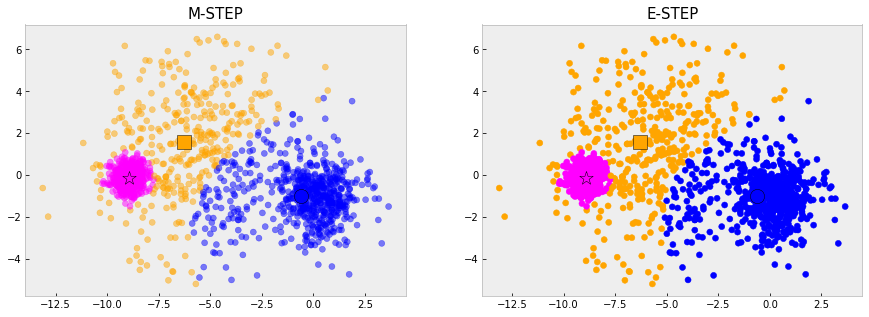

t =  6 : 	 2.5263895582436415
Component:  1 , Pi:  0.3204851066882749 , Mean:  [-8.92159574 -0.13469568] , Sigma:  [[0.18622316 0.01631527]
 [0.01631527 0.20547208]]
Component:  2 , Pi:  0.2549580094537447 , Mean:  [-6.13797775  1.36999325] , Sigma:  [[4.90046749 1.53298719]
 [1.53298719 6.15851507]]
Component:  3 , Pi:  0.42455688385797974 , Mean:  [-0.39790916 -1.01710601] , Sigma:  [[ 3.12795373 -0.06788641]
 [-0.06788641  1.45134012]]


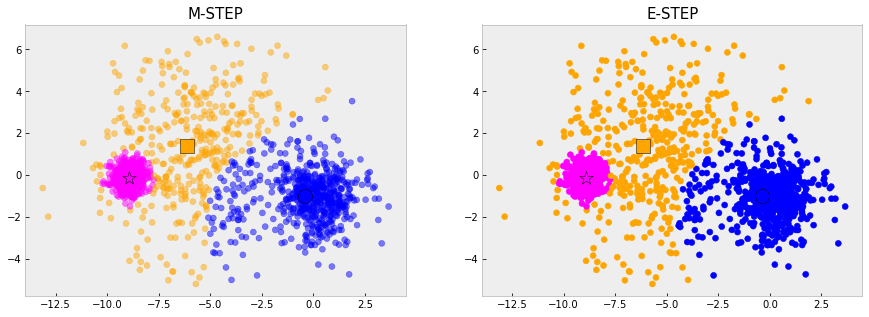

t =  7 : 	 2.350087578488143
Component:  1 , Pi:  0.320854125601498 , Mean:  [-8.92282374 -0.13388608] , Sigma:  [[0.18718215 0.016503  ]
 [0.016503   0.20554005]]
Component:  2 , Pi:  0.2759387661208799 , Mean:  [-5.98129554  1.20827403] , Sigma:  [[4.97248418 1.23121267]
 [1.23121267 6.31070227]]
Component:  3 , Pi:  0.4032071082776224 , Mean:  [-0.19767534 -1.03209566] , Sigma:  [[ 2.36484029 -0.08956481]
 [-0.08956481  1.31524016]]


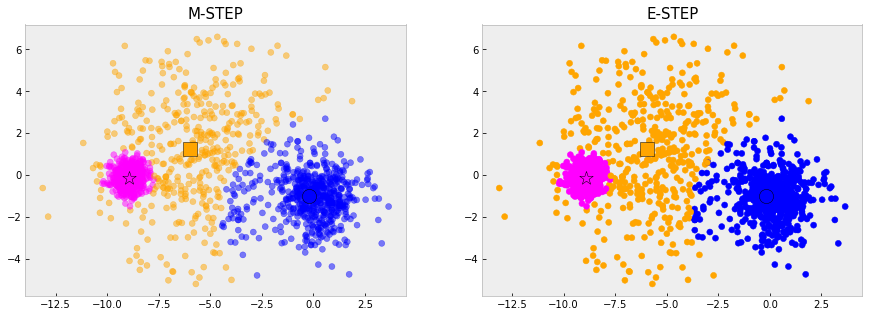

t =  8 : 	 2.0038947878151268
Component:  1 , Pi:  0.3213671032086353 , Mean:  [-8.92379941 -0.13348237] , Sigma:  [[0.18802351 0.01664561]
 [0.01664561 0.20590385]]
Component:  2 , Pi:  0.29451354376075667 , Mean:  [-5.82269935  1.08279509] , Sigma:  [[5.10419318 0.94187098]
 [0.94187098 6.36301327]]
Component:  3 , Pi:  0.38411935303060757 , Mean:  [-0.02712917 -1.04576231] , Sigma:  [[ 1.7647037  -0.10238983]
 [-0.10238983  1.20916862]]


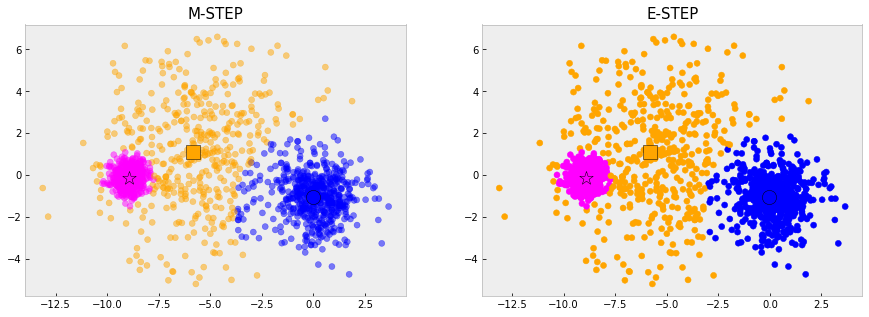

t =  9 : 	 1.5466008375556652
Component:  1 , Pi:  0.3220007628856909 , Mean:  [-8.92438322 -0.13337183] , Sigma:  [[0.18893458 0.01674967]
 [0.01674967 0.2064443 ]]
Component:  2 , Pi:  0.30926458209636376 , Mean:  [-5.68020977  0.9949175 ] , Sigma:  [[5.26966444 0.69948939]
 [0.69948939 6.3491501 ]]
Component:  3 , Pi:  0.3687346550179457 , Mean:  [ 0.10100944 -1.05887384] , Sigma:  [[ 1.35724675 -0.10175427]
 [-0.10175427  1.14013417]]


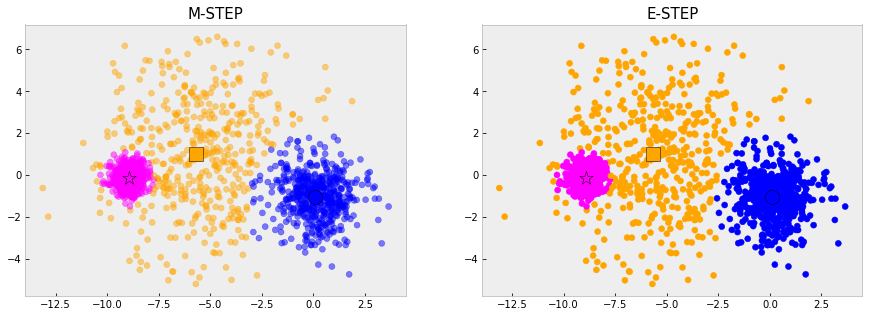

t =  10 : 	 1.1295336277668864
Component:  1 , Pi:  0.32263335606684646 , Mean:  [-8.92463364 -0.13342636] , Sigma:  [[0.18985573 0.01681642]
 [0.01681642 0.2070197 ]]
Component:  2 , Pi:  0.3192162506132481 , Mean:  [-5.56926052  0.94376762] , Sigma:  [[5.45062537 0.52798178]
 [0.52798178 6.30802968]]
Component:  3 , Pi:  0.35815039331990495 , Mean:  [ 0.17892691 -1.07193721] , Sigma:  [[ 1.13818869 -0.08756874]
 [-0.08756874  1.09930969]]


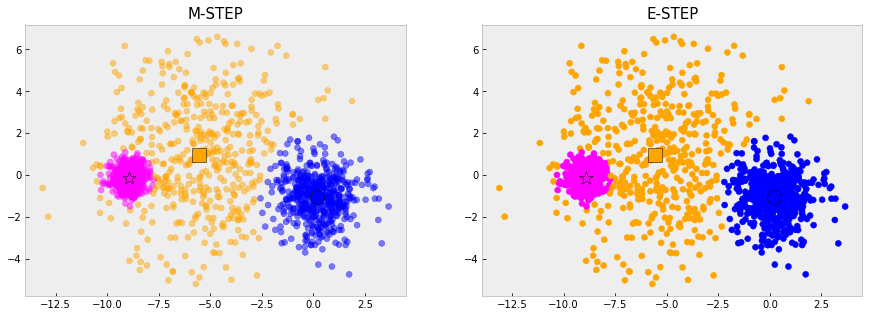

t =  11 : 	 0.7550244148501859
Component:  1 , Pi:  0.32314839577771787 , Mean:  [-8.92460777 -0.13354551] , Sigma:  [[0.19064025 0.01685227]
 [0.01685227 0.20750423]]
Component:  2 , Pi:  0.3252730683127786 , Mean:  [-5.49046368  0.91616447] , Sigma:  [[5.62369798 0.41382827]
 [0.41382827 6.27398886]]
Component:  3 , Pi:  0.3515785359095036 , Mean:  [ 0.21836495 -1.08239025] , Sigma:  [[ 1.04504249 -0.07295986]
 [-0.07295986  1.07299026]]


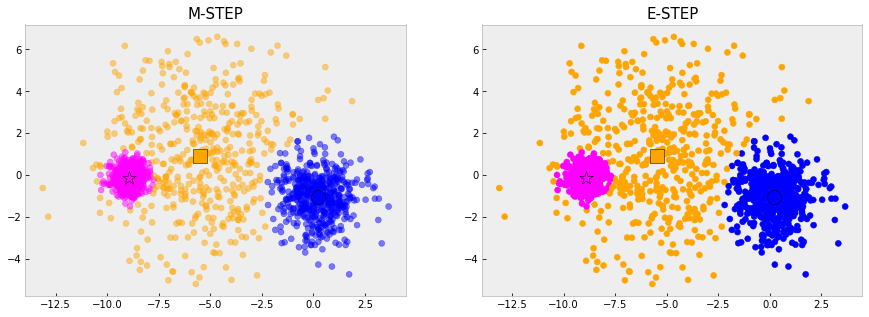

t =  12 : 	 0.4912603954597812
Component:  1 , Pi:  0.3235195586312544 , Mean:  [-8.92442132 -0.13366503] , Sigma:  [[0.19122363 0.01687008]
 [0.01687008 0.2078566 ]]
Component:  2 , Pi:  0.32891124949976996 , Mean:  [-5.43738196  0.90047428] , Sigma:  [[5.76513755 0.33857169]
 [0.33857169 6.25343076]]
Component:  3 , Pi:  0.347569191868975 , Mean:  [ 0.23747996 -1.0893642 ] , Sigma:  [[ 1.006902   -0.06367545]
 [-0.06367545  1.05510691]]


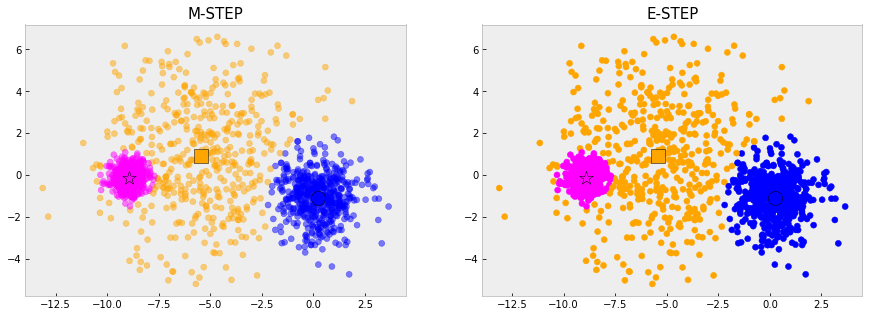

t =  13 : 	 0.32011583874092814
Component:  1 , Pi:  0.32376785467710334 , Mean:  [-8.92420423 -0.13375825] , Sigma:  [[0.1916217  0.0168792 ]
 [0.0168792  0.20809167]]
Component:  2 , Pi:  0.3311494471444217 , Mean:  [-5.40251972  0.89086787] , Sigma:  [[5.86910148 0.28852786]
 [0.28852786 6.24215802]]
Component:  3 , Pi:  0.34508269817847453 , Mean:  [ 0.2472209  -1.09365189] , Sigma:  [[ 0.98938691 -0.05830355]
 [-0.05830355  1.04300626]]


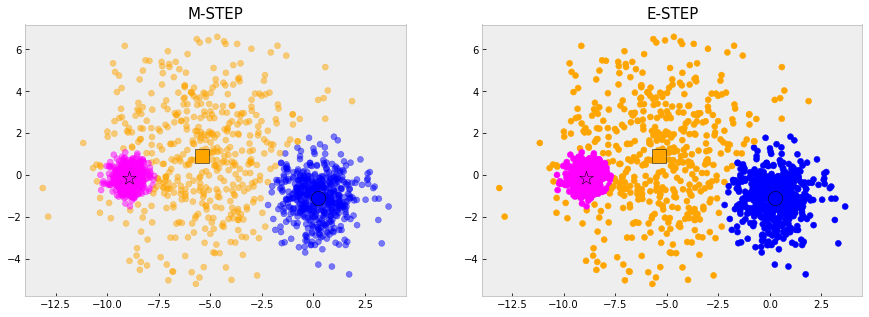

t =  14 : 	 0.21066190011249086
Component:  1 , Pi:  0.3239284318689052 , Mean:  [-8.92402223 -0.13382437] , Sigma:  [[0.19188151 0.01688441]
 [0.01688441 0.20824254]]
Component:  2 , Pi:  0.3325706252045649 , Mean:  [-5.37967267  0.88465575] , Sigma:  [[5.94176678 0.25485518]
 [0.25485518 6.23604115]]
Component:  3 , Pi:  0.34350094292652966 , Mean:  [ 0.25259147 -1.09623443] , Sigma:  [[ 0.98014841 -0.0551371 ]
 [-0.0551371   1.03488828]]


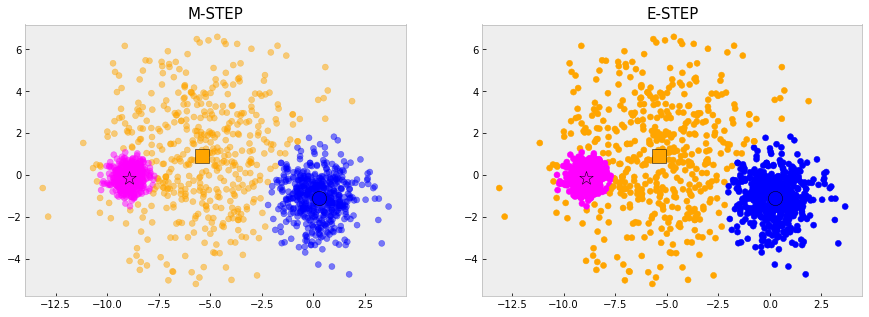

t =  15 : 	 0.14010482751645975
Component:  1 , Pi:  0.3240316510745567 , Mean:  [-8.92388825 -0.1338698 ] , Sigma:  [[0.19204836 0.01688778]
 [0.01688778 0.20833872]]
Component:  2 , Pi:  0.3334967706830096 , Mean:  [-5.3645827   0.88051625] , Sigma:  [[5.99159202 0.23202577]
 [0.23202577 6.23262681]]
Component:  3 , Pi:  0.34247157824243335 , Mean:  [ 0.25576729 -1.09780741] , Sigma:  [[ 0.97474508 -0.0531984 ]
 [-0.0531984   1.0294488 ]]


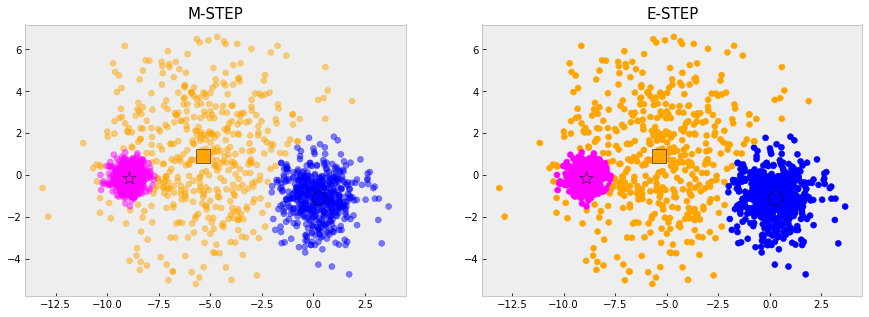

t =  16 : 	 0.0940069753495031
Component:  1 , Pi:  0.3240984160169657 , Mean:  [-8.92379474 -0.13390075] , Sigma:  [[0.19215543 0.01689014]
 [0.01689014 0.20840057]]
Component:  2 , Pi:  0.33411131363481417 , Mean:  [-5.35452245  0.87771757] , Sigma:  [[6.02556878 0.21648351]
 [0.21648351 6.2306394 ]]
Component:  3 , Pi:  0.34179027034821996 , Mean:  [ 0.25774299 -1.09878761] , Sigma:  [[ 0.97137483 -0.05197057]
 [-0.05197057  1.02579196]]


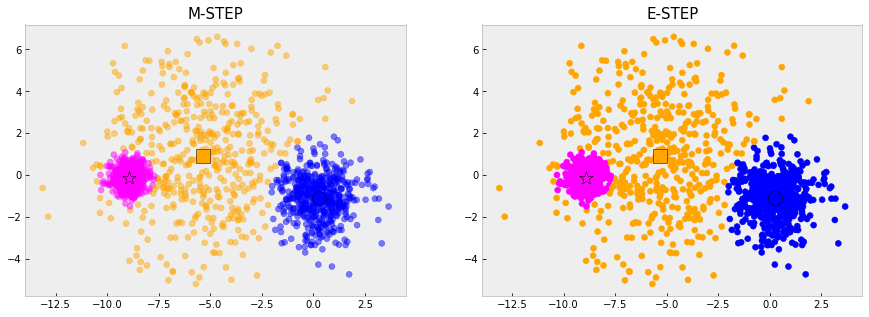

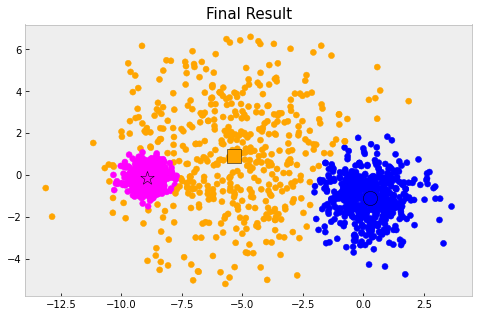

In [58]:
NumComponents = 3
plt.scatter(X2[:,0],X2[:,1],c=colors[T2])
plt.title('Original Data',size=15);plt.show()

EM_Means, EM_Sigs, EM_Ps, pZ_X = EM_GaussianMixture(X2, NumComponents,50,0.1, display=True)

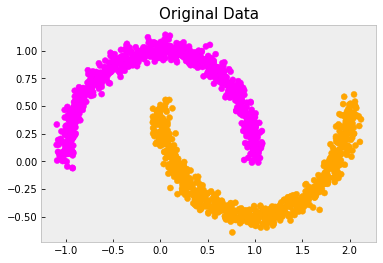

Iteration t=0
Component:  1 , Pi:  0.5 , Mean:  [0.05897067 0.08519928] , Sigma:  [[0.5 0. ]
 [0.  0.5]]
Component:  2 , Pi:  0.5 , Mean:  [1.92617303 0.16801734] , Sigma:  [[0.5 0. ]
 [0.  0.5]]


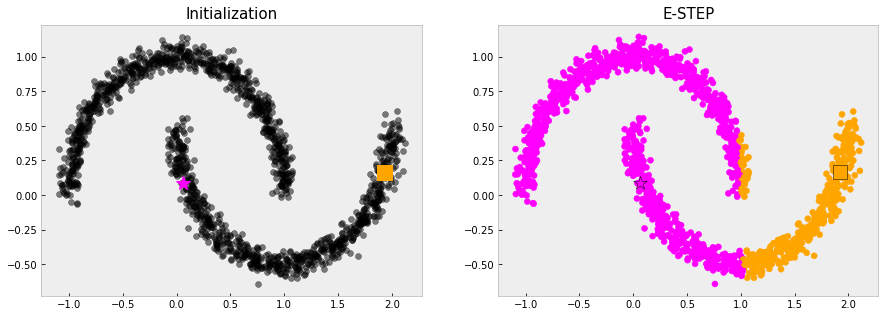

t =  1 : 	 2.538412658791927
Component:  1 , Pi:  0.6817899990226424 , Mean:  [0.08608974 0.3685216 ] , Sigma:  [[ 0.44222527 -0.12184994]
 [-0.12184994  0.24764034]]
Component:  2 , Pi:  0.31821000097735797 , Mean:  [1.38697635 0.00600851] , Sigma:  [[ 0.26615251 -0.01548129]
 [-0.01548129  0.15545858]]


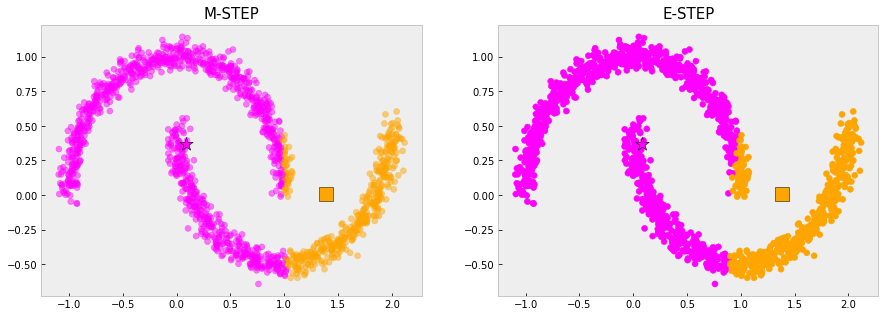

t =  2 : 	 0.27160212600790407
Component:  1 , Pi:  0.6811896693152419 , Mean:  [0.08324374 0.39539715] , Sigma:  [[ 0.44607288 -0.10794902]
 [-0.10794902  0.23809969]]
Component:  2 , Pi:  0.3188103306847575 , Mean:  [ 1.39060766 -0.05073281] , Sigma:  [[0.24559799 0.03100476]
 [0.03100476 0.12986802]]


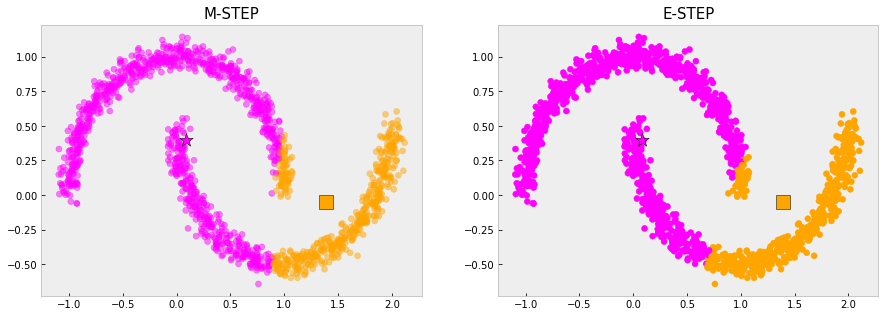

t =  3 : 	 0.2883655541338241
Component:  1 , Pi:  0.6773191995534947 , Mean:  [0.07501761 0.42756752] , Sigma:  [[ 0.43784362 -0.08385977]
 [-0.08385977  0.21764239]]
Component:  2 , Pi:  0.3226808004465049 , Mean:  [ 1.39219314 -0.11290842] , Sigma:  [[0.24048462 0.06841732]
 [0.06841732 0.11020455]]


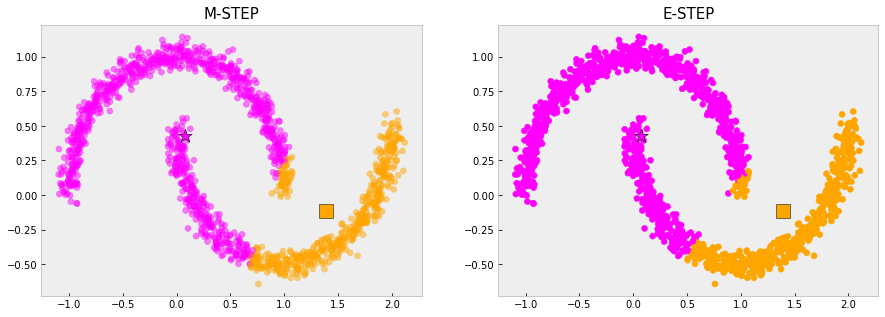

t =  4 : 	 0.2530257041590738
Component:  1 , Pi:  0.6701756030820879 , Mean:  [0.06339214 0.45719539] , Sigma:  [[ 0.42731175 -0.05931052]
 [-0.05931052  0.19372682]]
Component:  2 , Pi:  0.3298243969179119 , Mean:  [ 1.3872867  -0.16140373] , Sigma:  [[0.24120872 0.09234303]
 [0.09234303 0.0982426 ]]


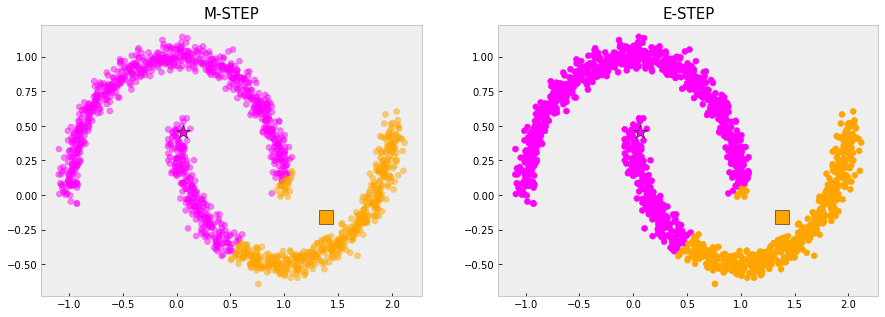

t =  5 : 	 0.15218420089883575
Component:  1 , Pi:  0.6659701304467128 , Mean:  [0.05562193 0.47522626] , Sigma:  [[ 0.41923047 -0.04270386]
 [-0.04270386  0.17625693]]
Component:  2 , Pi:  0.3340298695532877 , Mean:  [ 1.38611054 -0.18956444] , Sigma:  [[0.2405896  0.10443551]
 [0.10443551 0.09317586]]


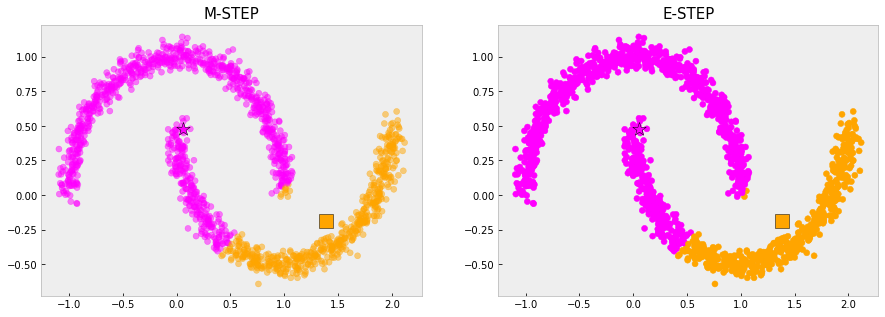

t =  6 : 	 0.06618035911927439
Component:  1 , Pi:  0.6672690563362482 , Mean:  [0.05513235 0.48024457] , Sigma:  [[ 0.41607868 -0.03635554]
 [-0.03635554  0.16926272]]
Component:  2 , Pi:  0.33273094366375233 , Mean:  [ 1.39228636 -0.20222356] , Sigma:  [[0.23665114 0.10985743]
 [0.10985743 0.09156114]]


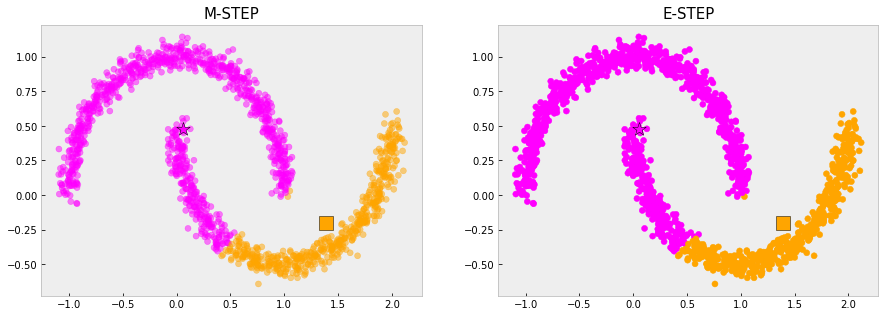

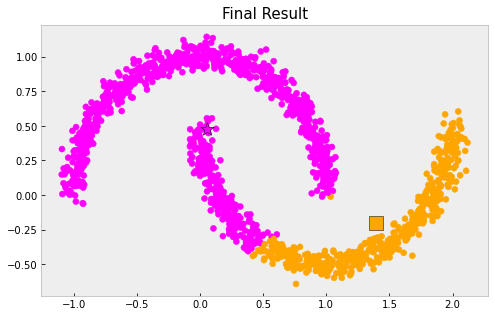

In [59]:
NumComponents = 2
plt.scatter(X3[:,0],X3[:,1],c=colors[T3])
plt.title('Original Data',size=15);plt.show()

EM_Means, EM_Sigs, EM_Ps, pZ_X = EM_GaussianMixture(X3, NumComponents,50,0.1, display=True)

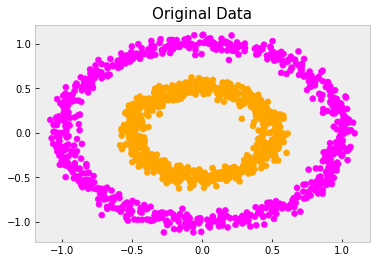

Iteration t=0
Component:  1 , Pi:  0.5 , Mean:  [-0.63131167 -0.75492195] , Sigma:  [[0.5 0. ]
 [0.  0.5]]
Component:  2 , Pi:  0.5 , Mean:  [-0.80589987 -0.60477391] , Sigma:  [[0.5 0. ]
 [0.  0.5]]


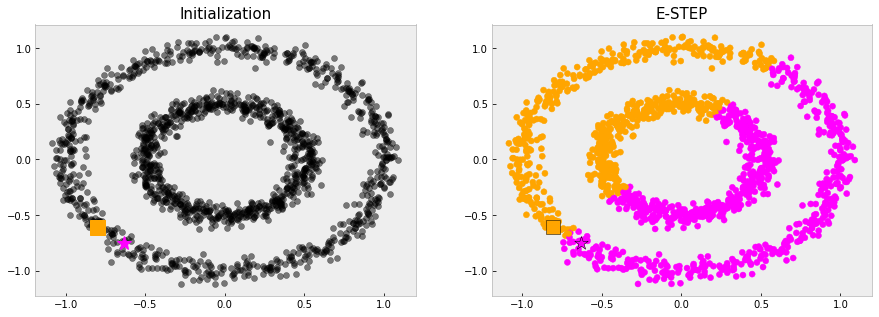

t =  1 : 	 3.572189291735389
Component:  1 , Pi:  0.5115950740418511 , Mean:  [ 0.05325095 -0.04730442] , Sigma:  [[0.31310656 0.00293483]
 [0.00293483 0.31582909]]
Component:  2 , Pi:  0.488404925958149 , Mean:  [-0.05567863  0.04692511] , Sigma:  [[0.31262317 0.00290935]
 [0.00290935 0.3152308 ]]


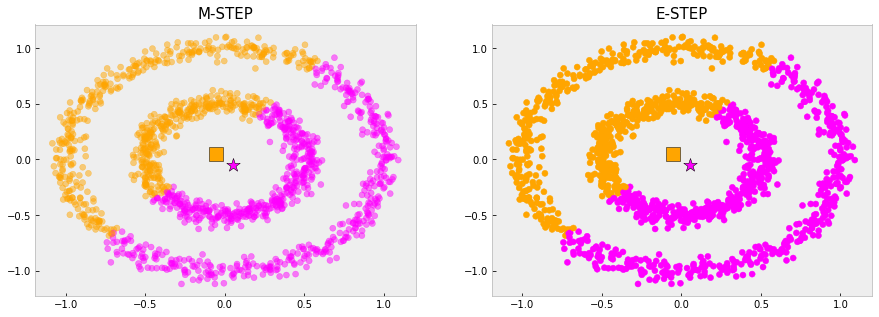

t =  2 : 	 0.0015601590961966264
Component:  1 , Pi:  0.5115961362863063 , Mean:  [ 0.05352396 -0.04754316] , Sigma:  [[0.31315588 0.00296876]
 [0.00296876 0.31592364]]
Component:  2 , Pi:  0.48840386371369393 , Mean:  [-0.05596483  0.04717538] , Sigma:  [[0.31250901 0.00292816]
 [0.00292816 0.31508449]]


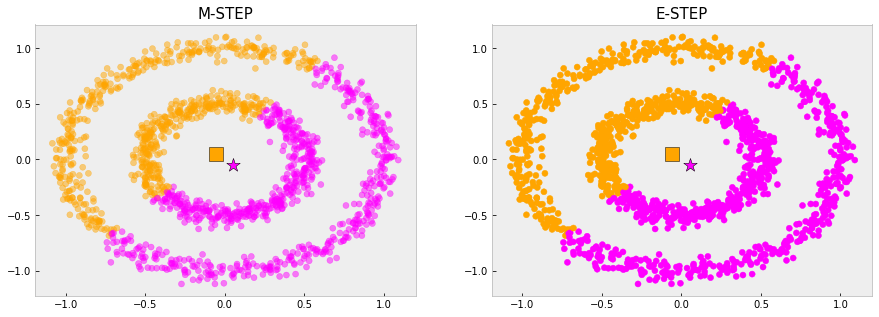

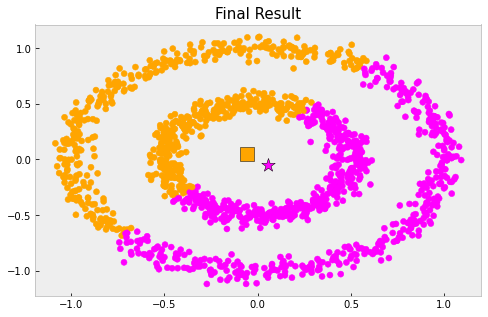

In [60]:
NumComponents = 2
plt.scatter(X4[:,0],X4[:,1],c=colors[T4])
plt.title('Original Data',size=15);plt.show()

EM_Means, EM_Sigs, EM_Ps, pZ_X = EM_GaussianMixture(X4, NumComponents,50,0.1, display=True)

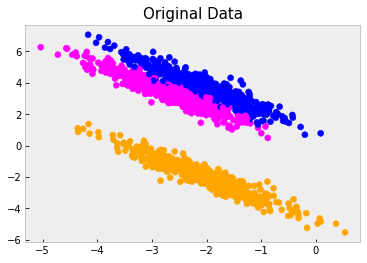

Iteration t=0
Component:  1 , Pi:  0.3333333333333333 , Mean:  [-2.42839872  4.52599917] , Sigma:  [[0.5 0. ]
 [0.  0.5]]
Component:  2 , Pi:  0.3333333333333333 , Mean:  [-1.23293534  3.42191629] , Sigma:  [[0.5 0. ]
 [0.  0.5]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-2.71427377 -0.85189128] , Sigma:  [[0.5 0. ]
 [0.  0.5]]


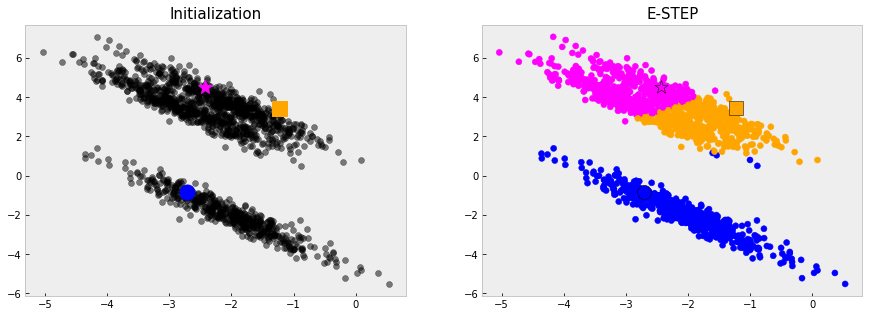

t =  1 : 	 7.779343419948932
Component:  1 , Pi:  0.35139019492626583 , Mean:  [-2.91196493  4.25830048] , Sigma:  [[ 0.38243164 -0.29797112]
 [-0.29797112  0.62517318]]
Component:  2 , Pi:  0.31143145516749365 , Mean:  [-1.80927152  2.79607871] , Sigma:  [[ 0.2919625  -0.19868682]
 [-0.19868682  0.48883408]]
Component:  3 , Pi:  0.33717834990623946 , Mean:  [-2.03800135 -1.92736902] , Sigma:  [[ 0.62562389 -0.80282375]
 [-0.80282375  1.3438186 ]]


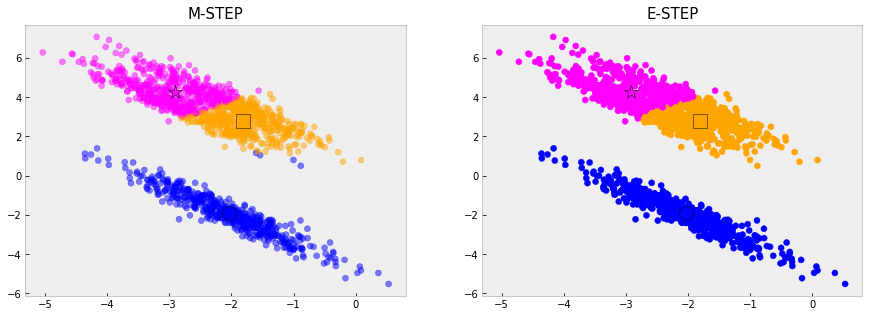

t =  2 : 	 0.5864163398956476
Component:  1 , Pi:  0.3511602231259526 , Mean:  [-2.8944019  4.2306224] , Sigma:  [[ 0.40857039 -0.33454146]
 [-0.33454146  0.6779385 ]]
Component:  2 , Pi:  0.31550644305402326 , Mean:  [-1.82247813  2.80615336] , Sigma:  [[ 0.31004564 -0.23300032]
 [-0.23300032  0.55537954]]
Component:  3 , Pi:  0.33333333382002367 , Mean:  [-2.04740253 -1.96122293] , Sigma:  [[ 0.62225044 -0.83854324]
 [-0.83854324  1.2574425 ]]


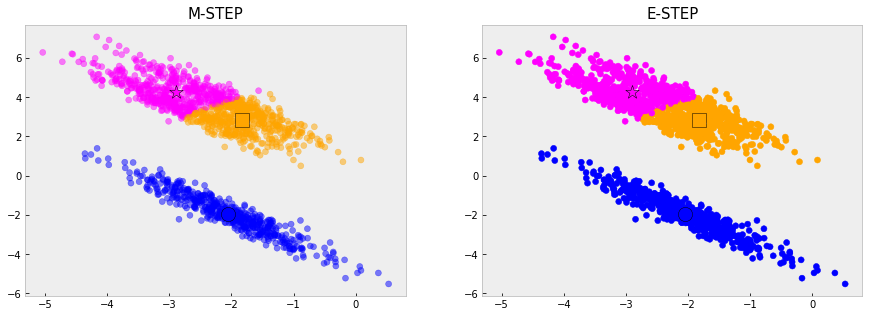

t =  3 : 	 0.2577179271881774
Component:  1 , Pi:  0.3512207768894302 , Mean:  [-2.88149986  4.20786991] , Sigma:  [[ 0.42485794 -0.35880668]
 [-0.35880668  0.71231446]]
Component:  2 , Pi:  0.31544589011670776 , Mean:  [-1.83663763  2.83121277] , Sigma:  [[ 0.32208254 -0.25260666]
 [-0.25260666  0.58765936]]
Component:  3 , Pi:  0.3333333329938618 , Mean:  [-2.04740253 -1.96122294] , Sigma:  [[ 0.62225044 -0.83854324]
 [-0.83854324  1.25744248]]


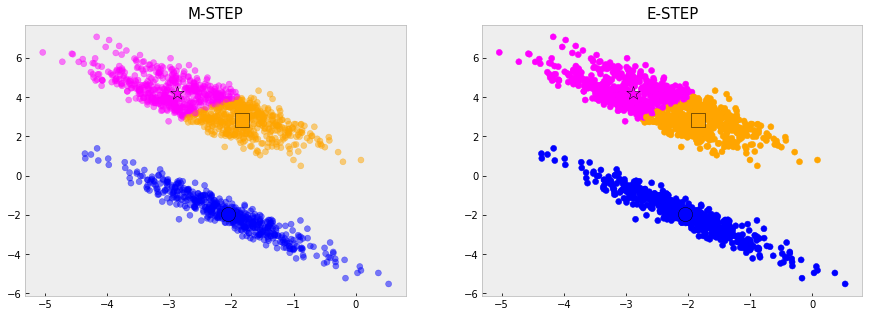

t =  4 : 	 0.19398978256541055
Component:  1 , Pi:  0.35111103412537464 , Mean:  [-2.8721178   4.19045085] , Sigma:  [[ 0.43661797 -0.37727045]
 [-0.37727045  0.73969257]]
Component:  2 , Pi:  0.3155556329070248 , Mean:  [-1.8474402  2.8510733] , Sigma:  [[ 0.33101326 -0.26682573]
 [-0.26682573  0.61053088]]
Component:  3 , Pi:  0.3333333329676003 , Mean:  [-2.04740252 -1.96122294] , Sigma:  [[ 0.62225044 -0.83854324]
 [-0.83854324  1.25744248]]


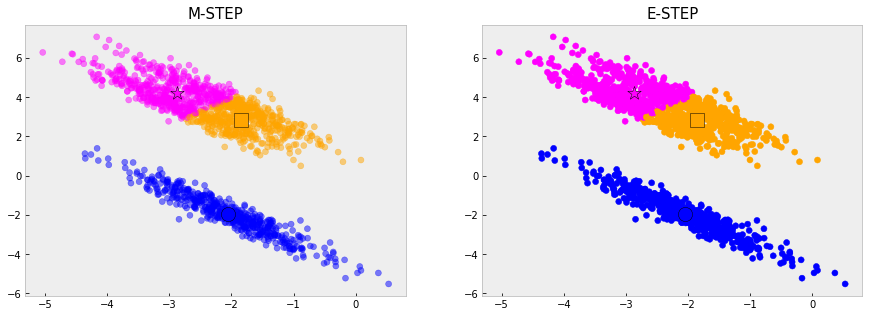

t =  5 : 	 0.15259566717951212
Component:  1 , Pi:  0.3509502711332826 , Mean:  [-2.86495146  4.17647092] , Sigma:  [[ 0.44556219 -0.39177494]
 [-0.39177494  0.76170435]]
Component:  2 , Pi:  0.31571639591487805 , Mean:  [-1.85592807  2.8672954 ] , Sigma:  [[ 0.33785552 -0.27780176]
 [-0.27780176  0.62818951]]
Component:  3 , Pi:  0.3333333329518391 , Mean:  [-2.04740252 -1.96122294] , Sigma:  [[ 0.62225044 -0.83854324]
 [-0.83854324  1.25744248]]


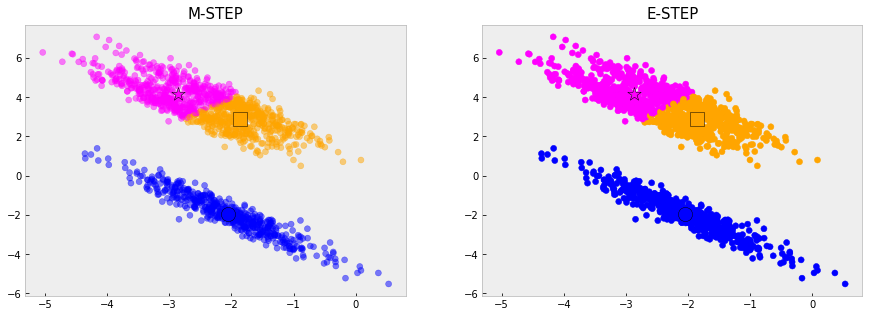

t =  6 : 	 0.12372227526742197
Component:  1 , Pi:  0.3507722219241413 , Mean:  [-2.85931854  4.16490051] , Sigma:  [[ 0.45259175 -0.40349696]
 [-0.40349696  0.77980177]]
Component:  2 , Pi:  0.3158944451353951 , Mean:  [-1.86275164  2.88088119] , Sigma:  [[ 0.34322518 -0.28658176]
 [-0.28658176  0.64244231]]
Component:  3 , Pi:  0.33333333294046397 , Mean:  [-2.04740252 -1.96122294] , Sigma:  [[ 0.62225044 -0.83854324]
 [-0.83854324  1.25744248]]


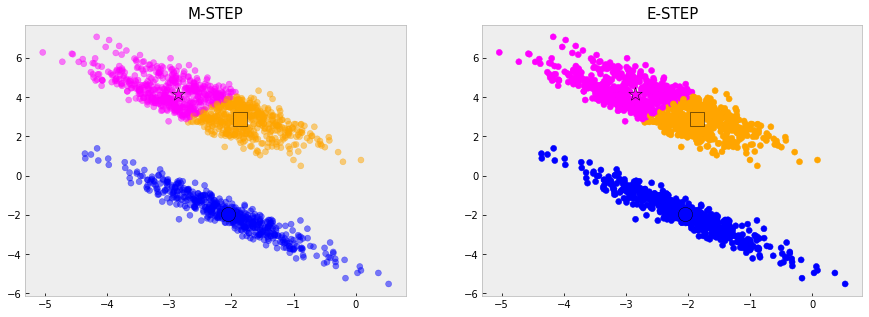

t =  7 : 	 0.10257043672691524
Component:  1 , Pi:  0.35059040797193036 , Mean:  [-2.85480752  4.15510735] , Sigma:  [[ 0.45823694 -0.41318088]
 [-0.41318088  0.79498868]]
Component:  2 , Pi:  0.31607625909662124 , Mean:  [-1.86832849  2.89248231] , Sigma:  [[ 0.34751692 -0.29377998]
 [-0.29377998  0.65427887]]
Component:  3 , Pi:  0.3333333329314482 , Mean:  [-2.04740252 -1.96122294] , Sigma:  [[ 0.62225044 -0.83854324]
 [-0.83854324  1.25744247]]


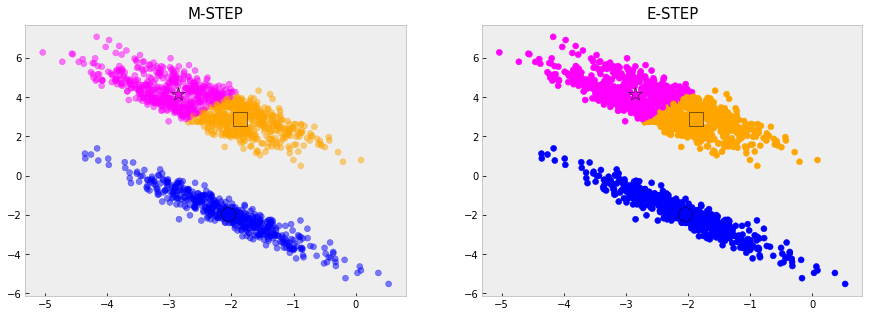

t =  8 : 	 0.08649786413165295
Component:  1 , Pi:  0.35041102648866795 , Mean:  [-2.85114974  4.14667433] , Sigma:  [[ 0.46283773 -0.42131879]
 [-0.42131879  0.80795238]]
Component:  2 , Pi:  0.3162556405874046 , Mean:  [-1.87294084  2.90254227] , Sigma:  [[ 0.35099396 -0.29979144]
 [-0.29979144  0.66431456]]
Component:  3 , Pi:  0.33333333292392725 , Mean:  [-2.04740252 -1.96122294] , Sigma:  [[ 0.62225044 -0.83854324]
 [-0.83854324  1.25744247]]


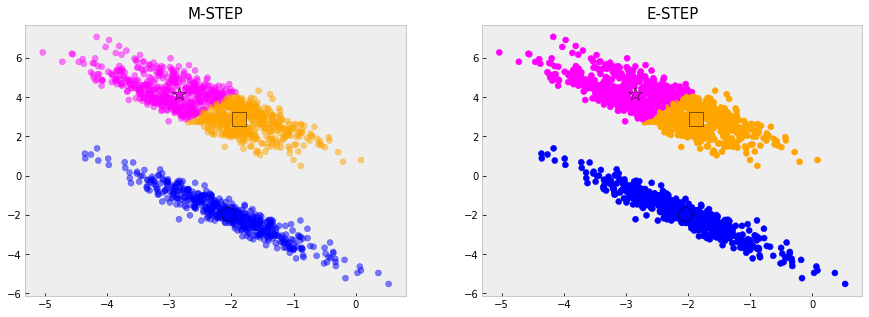

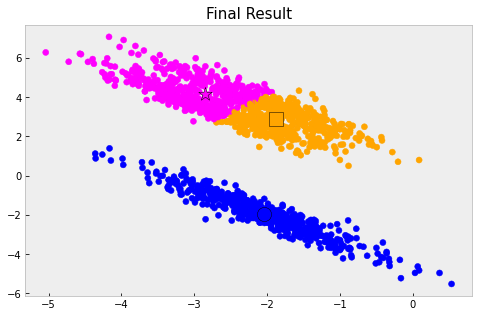

In [61]:
NumComponents = 3
plt.scatter(X5[:,0],X5[:,1],c=colors[T5])
plt.title('Original Data',size=15);plt.show()

EM_Means, EM_Sigs, EM_Ps, pZ_X = EM_GaussianMixture(X5, NumComponents,50,0.1)
# we are assuming the covariance is a full covariance (not isotropic)

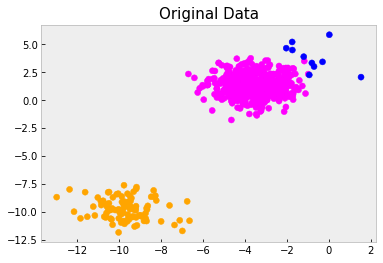

Iteration t=0
Component:  1 , Pi:  0.3333333333333333 , Mean:  [-3.21963363  2.77391494] , Sigma:  [[0.5 0. ]
 [0.  0.5]]
Component:  2 , Pi:  0.3333333333333333 , Mean:  [-11.85178513 -10.57724038] , Sigma:  [[0.5 0. ]
 [0.  0.5]]
Component:  3 , Pi:  0.3333333333333333 , Mean:  [-3.63581411  0.36049325] , Sigma:  [[0.5 0. ]
 [0.  0.5]]


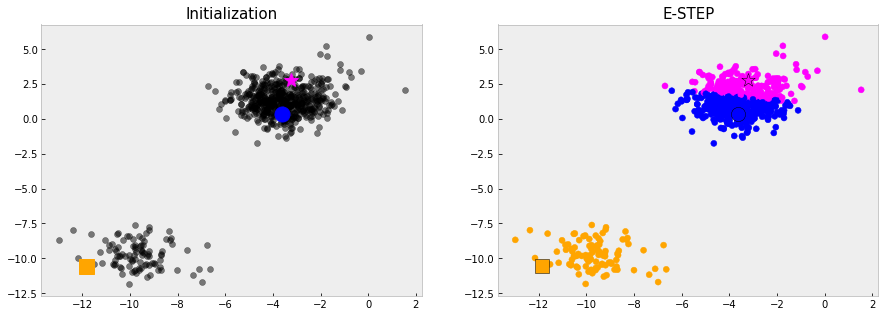

t =  1 : 	 7.8776119168122865
Component:  1 , Pi:  0.31762045623335367 , Mean:  [-3.32921299  2.28774794] , Sigma:  [[1.42837392 0.08573628]
 [0.08573628 0.5848078 ]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5184451175371382 , Mean:  [-3.73201521  0.76003736] , Sigma:  [[ 0.98670048 -0.09294647]
 [-0.09294647  0.46425044]]


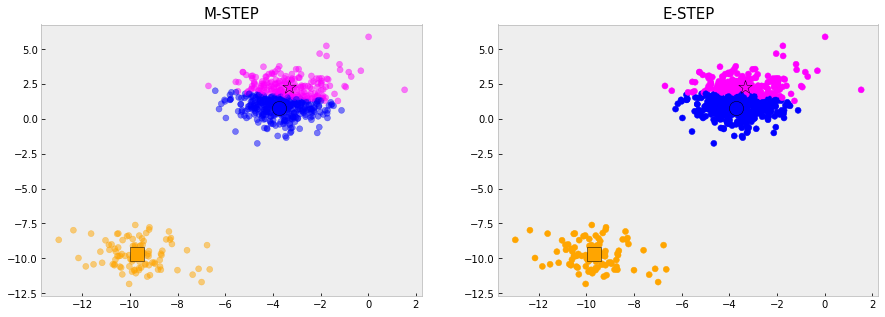

t =  2 : 	 0.7111497516840769
Component:  1 , Pi:  0.3114727250165996 , Mean:  [-3.38049076  2.23353608] , Sigma:  [[1.54304018 0.15749214]
 [0.15749214 0.68883863]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5245928487538918 , Mean:  [-3.696849    0.81012853] , Sigma:  [[ 0.94742511 -0.07017983]
 [-0.07017983  0.52534026]]


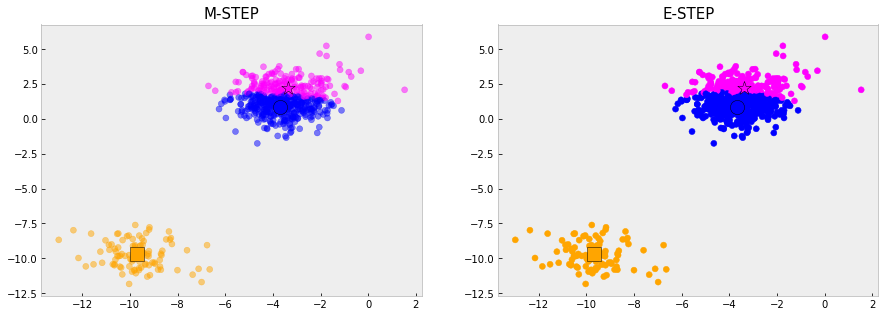

t =  3 : 	 0.48873543183886514
Component:  1 , Pi:  0.30586209930063973 , Mean:  [-3.41862677  2.19566121] , Sigma:  [[1.6145748  0.21081447]
 [0.21081447 0.76133217]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5302034744698517 , Mean:  [-3.67150151  0.8470402 ] , Sigma:  [[ 0.92595848 -0.05730791]
 [-0.05730791  0.56670111]]


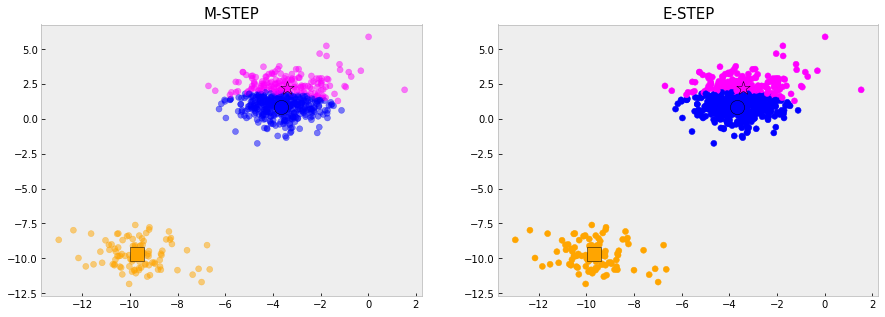

t =  4 : 	 0.3640909016500597
Component:  1 , Pi:  0.3004527421677294 , Mean:  [-3.44660707  2.16713296] , Sigma:  [[1.66556432 0.25257795]
 [0.25257795 0.81707302]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5356128316027621 , Mean:  [-3.65325204  0.8766634 ] , Sigma:  [[ 0.91212208 -0.05035733]
 [-0.05035733  0.59759719]]


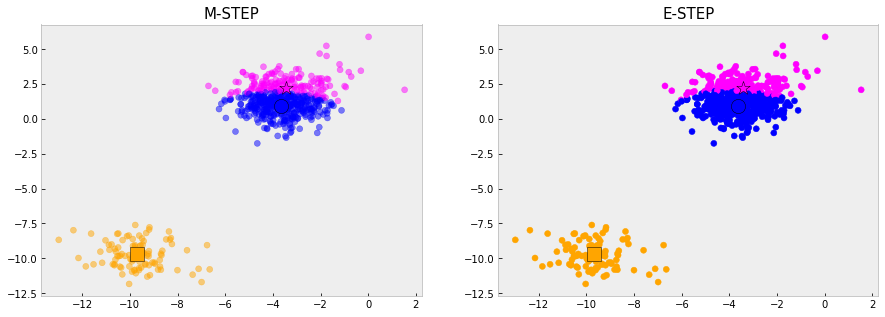

t =  5 : 	 0.2808973157076235
Component:  1 , Pi:  0.29513258236973006 , Mean:  [-3.46624623  2.14483075] , Sigma:  [[1.70449752 0.2856464 ]
 [0.2856464  0.86226813]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.540932991400762 , Mean:  [-3.64050455  0.90152343] , Sigma:  [[ 0.90276587 -0.04701119]
 [-0.04701119  0.6219916 ]]


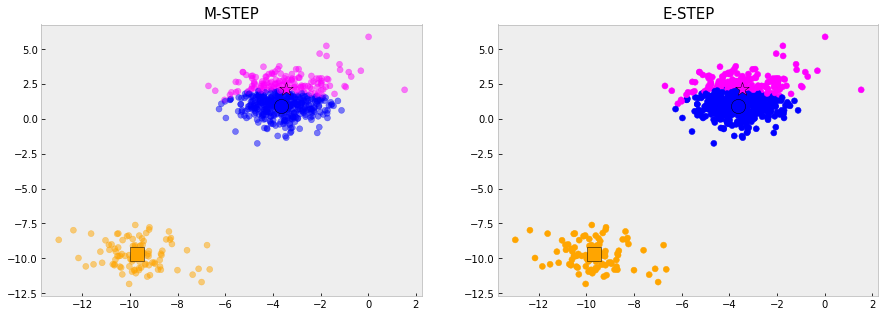

t =  6 : 	 0.2213699126663048
Component:  1 , Pi:  0.289850440279178 , Mean:  [-3.47895247  2.12701802] , Sigma:  [[1.73571757 0.31204443]
 [0.31204443 0.90025006]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5462151334913136 , Mean:  [-3.63207679  0.92299913] , Sigma:  [[ 0.89643883 -0.04597808]
 [-0.04597808  0.6419835 ]]


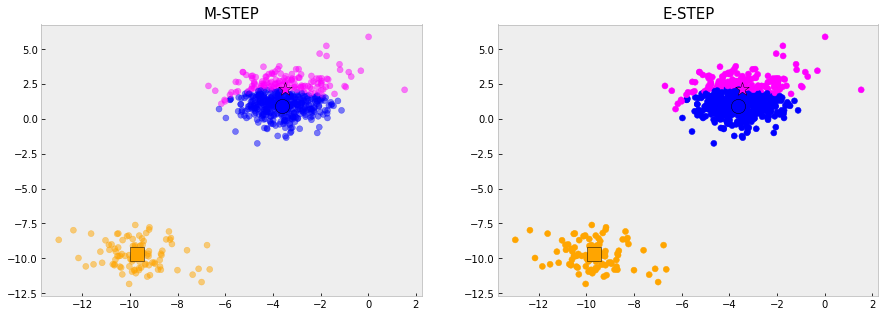

t =  7 : 	 0.1794917671953751
Component:  1 , Pi:  0.2845821944833561 , Mean:  [-3.48591542  2.11256953] , Sigma:  [[1.76177653 0.3333579 ]
 [0.3333579  0.93308685]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5514833792871355 , Mean:  [-3.62702092  0.94195682] , Sigma:  [[ 0.89228292 -0.04647506]
 [-0.04647506  0.65884119]]


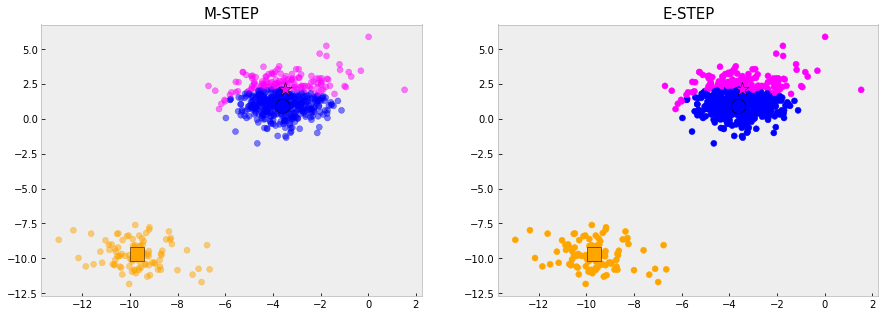

t =  8 : 	 0.15085747227303287
Component:  1 , Pi:  0.2793168841483004 , Mean:  [-3.48815142  2.10068381] , Sigma:  [[1.78426493 0.35084432]
 [0.35084432 0.96218532]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5567486896221918 , Mean:  [-3.62456467  0.95899058] , Sigma:  [[ 0.88972001 -0.04799414]
 [-0.04799414  0.67339555]]


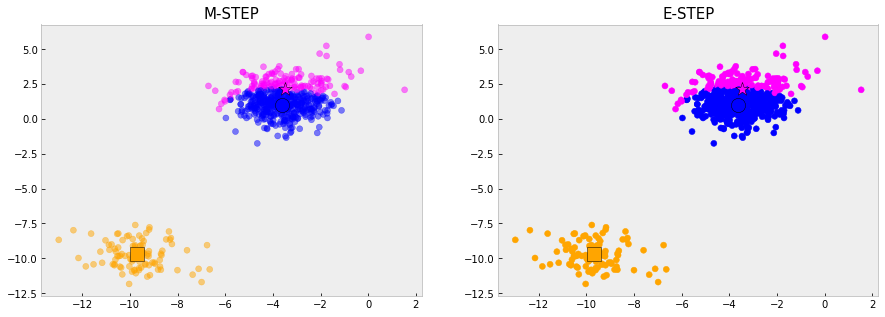

t =  9 : 	 0.1323131767782207
Component:  1 , Pi:  0.27405061692025096 , Mean:  [-3.48652019  2.09075782] , Sigma:  [[1.80419665 0.36549629]
 [0.36549629 0.98855705]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5620149568502406 , Mean:  [-3.62408185  0.97452875] , Sigma:  [[ 0.88833888 -0.05018963]
 [-0.05018963  0.68621847]]


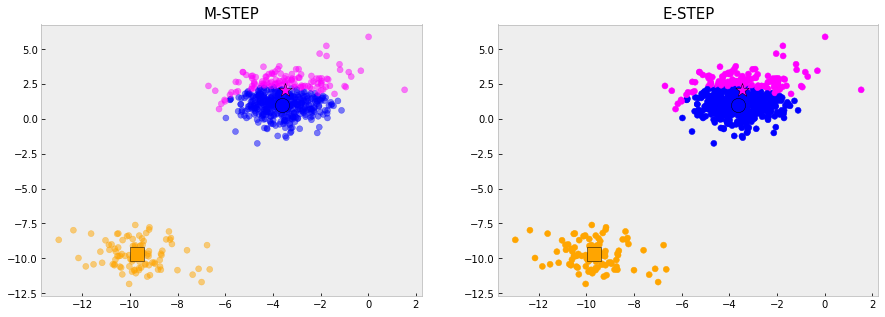

t =  10 : 	 0.12396104612490554
Component:  1 , Pi:  0.26878376192265924 , Mean:  [-3.48173916  2.08232457] , Sigma:  [[1.82222289 0.37809246]
 [0.37809246 1.0129527 ]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5672818118478328 , Mean:  [-3.62506998  0.98888799] , Sigma:  [[ 0.88784168 -0.05281846]
 [-0.05281846  0.69771509]]


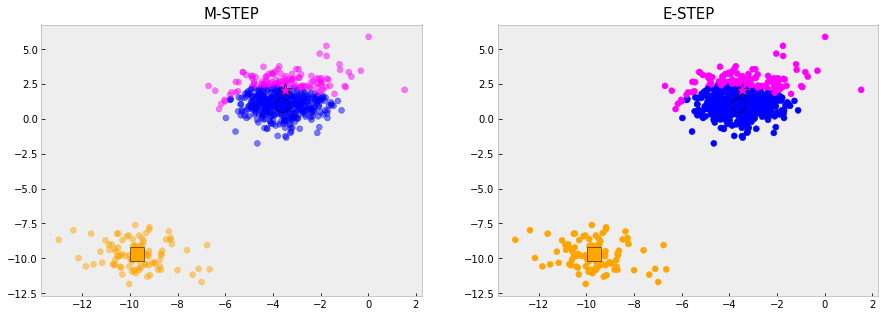

t =  11 : 	 0.11888016633732322
Component:  1 , Pi:  0.26351949286675214 , Mean:  [-3.47439963  2.07501782] , Sigma:  [[1.83876247 0.38924057]
 [0.38924057 1.0359387 ]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5725460809037402 , Mean:  [-3.62713021  1.00230458] , Sigma:  [[ 0.88801182 -0.05570586]
 [-0.05570586  0.70817686]]


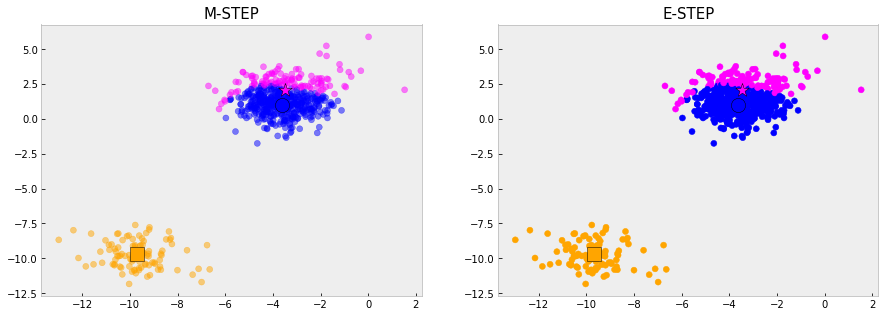

t =  12 : 	 0.11589617758357074
Component:  1 , Pi:  0.2582628931661889 , Mean:  [-3.46498392  2.06854962] , Sigma:  [[1.85408438 0.39941324]
 [0.39941324 1.05794608]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5778026806043031 , Mean:  [-3.62994931  1.01495478] , Sigma:  [[ 0.88869193 -0.05872449]
 [-0.05872449  0.71781462]]


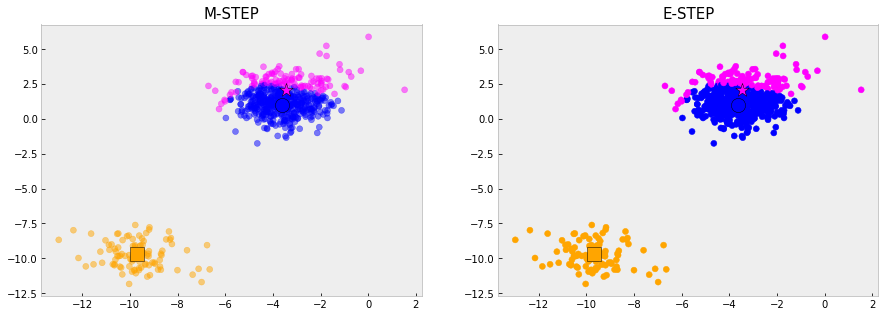

t =  13 : 	 0.11370689888811736
Component:  1 , Pi:  0.2530203223949211 , Mean:  [-3.45388215  2.06269447] , Sigma:  [[1.86836038 0.40897673]
 [0.40897673 1.07930406]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5830452513755701 , Mean:  [-3.63328376  1.02696932] , Sigma:  [[ 0.88976776 -0.06178097]
 [-0.06178097  0.72678073]]


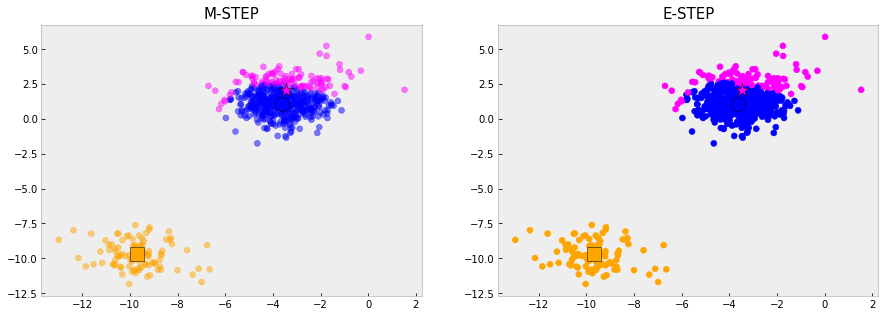

t =  14 : 	 0.11208813227122227
Component:  1 , Pi:  0.2477989341361411 , Mean:  [-3.44140757  2.05727738] , Sigma:  [[1.88169864 0.41821357]
 [0.41821357 1.1002643 ]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5882666396343507 , Mean:  [-3.63694615  1.03844417] , Sigma:  [[ 0.89115637 -0.06480684]
 [-0.06480684  0.73518463]]


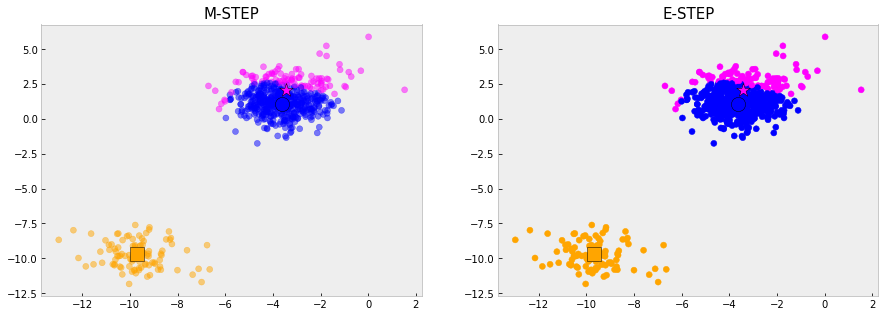

t =  15 : 	 0.11087389768455766
Component:  1 , Pi:  0.24260630244908873 , Mean:  [-3.42781013  2.0521644 ] , Sigma:  [[1.89416512 0.4273402 ]
 [0.4273402  1.12101903]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5934592713214023 , Mean:  [-3.64079386  1.04944891] , Sigma:  [[ 0.89279739 -0.06775219]
 [-0.06775219  0.74310422]]


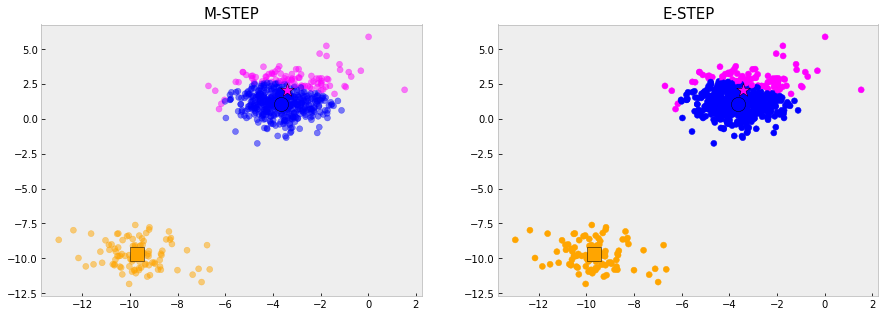

t =  16 : 	 0.10993944410395506
Component:  1 , Pi:  0.23745013480185936 , Mean:  [-3.4132881   2.04725488] , Sigma:  [[1.90579717 0.43652045]
 [0.43652045 1.14171471]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.5986154389686316 , Mean:  [-3.64471972  1.06003323] , Sigma:  [[ 0.89464655 -0.07058113]
 [-0.07058113  0.75059431]]


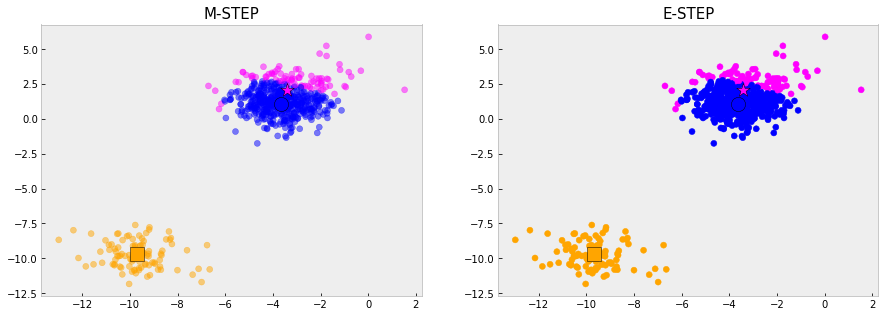

t =  17 : 	 0.10918984205195903
Component:  1 , Pi:  0.23233805492971765 , Mean:  [-3.3979977   2.04247509] , Sigma:  [[1.91661234 0.44587617]
 [0.44587617 1.16246249]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.6037275188407747 , Mean:  [-3.64864441  1.07023201] , Sigma:  [[ 0.8966709  -0.07326835]
 [-0.07326835  0.75769317]]


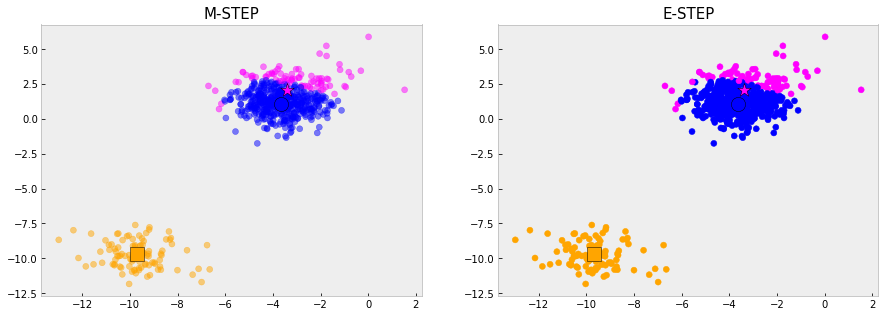

t =  18 : 	 0.10855231892463887
Component:  1 , Pi:  0.2272774412696883 , Mean:  [-3.38206127  2.0377729 ] , Sigma:  [[1.92661416 0.45549533]
 [0.45549533 1.18334622]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.6087881325008034 , Mean:  [-3.6525104   1.08006933] , Sigma:  [[ 0.89884533 -0.07579668]
 [-0.07579668  0.76442736]]


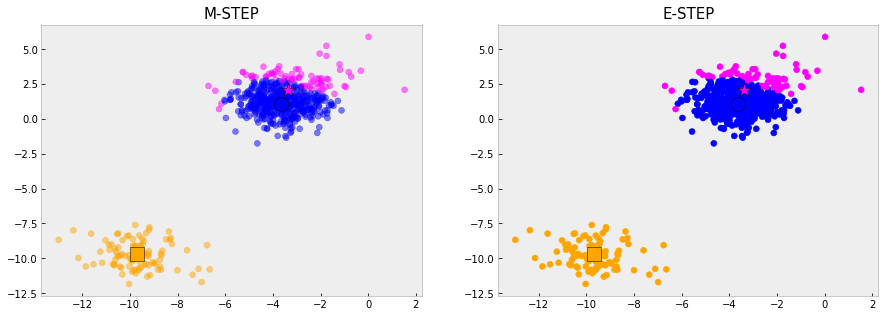

t =  19 : 	 0.10797108067869754
Component:  1 , Pi:  0.22227530882513186 , Mean:  [-3.36557383  2.03311325] , Sigma:  [[1.93579622 0.46543866]
 [0.46543866 1.20442856]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.6137902649453596 , Mean:  [-3.65627704  1.08956164] , Sigma:  [[ 0.90114998 -0.0781551 ]
 [-0.0781551   0.7708156 ]]


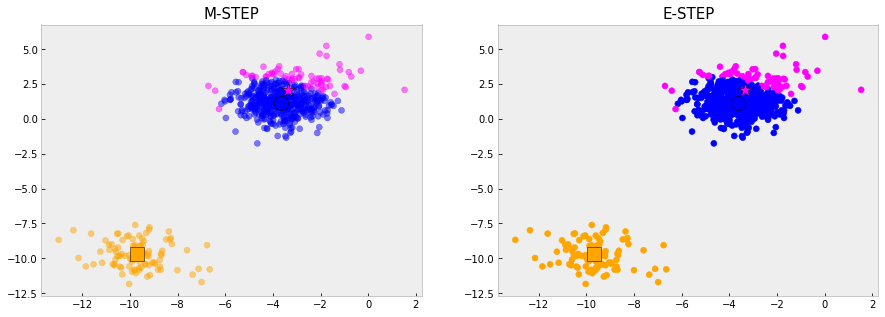

t =  20 : 	 0.10740374879834522
Component:  1 , Pi:  0.21733822496471625 , Mean:  [-3.3486085   2.02847437] , Sigma:  [[1.94414505 0.47574482]
 [0.47574482 1.22575578]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.6187273488057751 , Mean:  [-3.65991675  1.09872011] , Sigma:  [[ 0.90356836 -0.08033732]
 [-0.08033732  0.7768716 ]]


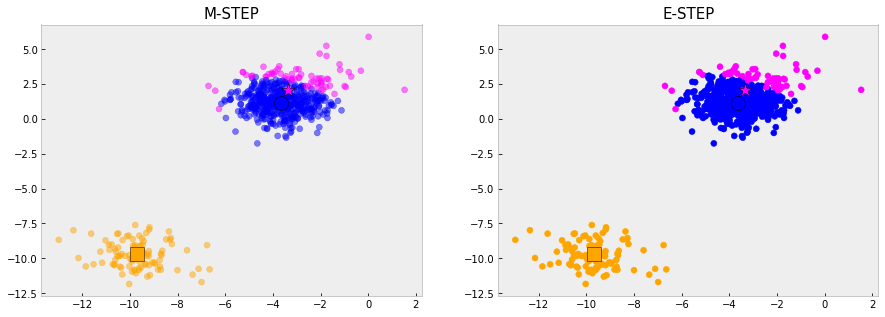

t =  21 : 	 0.10681881043153549
Component:  1 , Pi:  0.2124722523344945 , Mean:  [-3.331221    2.02384453] , Sigma:  [[1.95164249 0.48643479]
 [0.48643479 1.24736133]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.6235933214359967 , Mean:  [-3.66341189  1.10755259] , Sigma:  [[ 0.90608598 -0.0823407 ]
 [-0.0823407   0.7826062 ]]


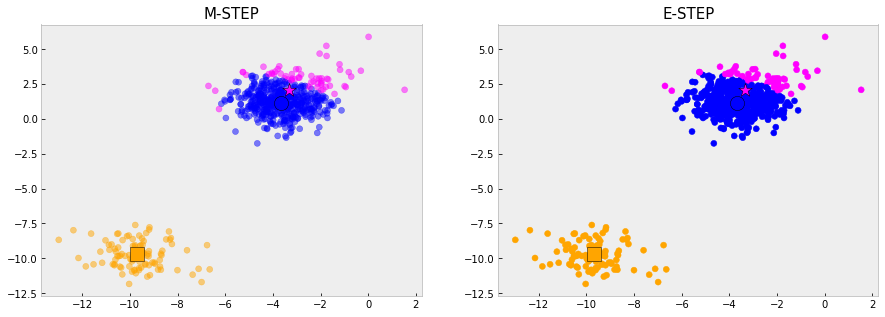

t =  22 : 	 0.10619367352807763
Component:  1 , Pi:  0.20768291428488314 , Mean:  [-3.31345323  2.01921931] , Sigma:  [[1.95826768 0.49751547]
 [0.49751547 1.26926869]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.6283826594856083 , Mean:  [-3.66675235  1.11606493] , Sigma:  [[ 0.90868934 -0.08416531]
 [-0.08416531  0.78802891]]


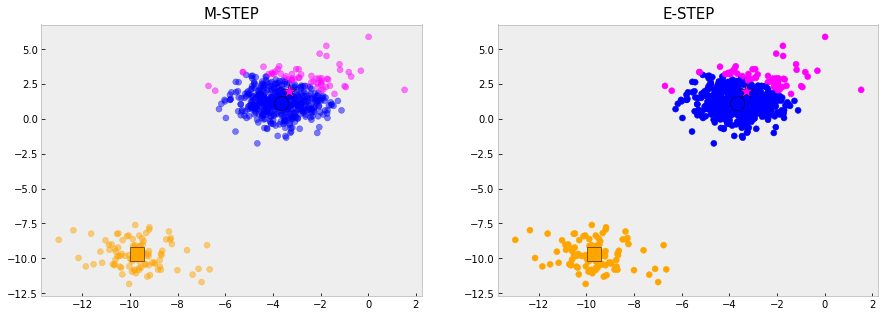

t =  23 : 	 0.10551306149769119
Component:  1 , Pi:  0.20297517971188592 , Mean:  [-3.29533639  2.01459938] , Sigma:  [[1.96399875 0.50898271]
 [0.50898271 1.29149346]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.6330903940586061 , Mean:  [-3.66993362  1.12426209] , Sigma:  [[ 0.91136528 -0.08581334]
 [-0.08581334  0.79314899]]


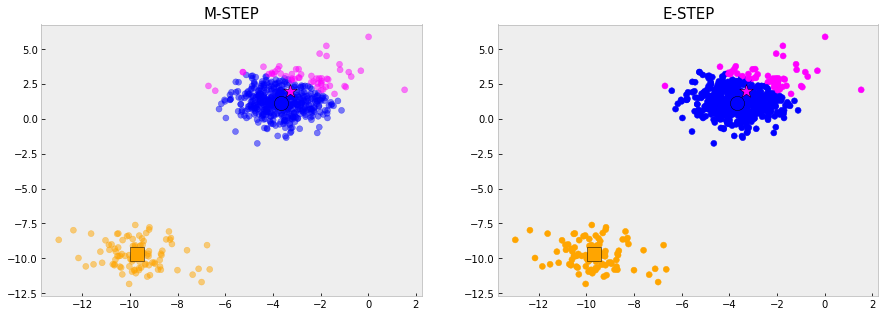

t =  24 : 	 0.10476758775951431
Component:  1 , Pi:  0.19835346493754336 , Mean:  [-3.27689348  2.00998859] , Sigma:  [[1.96881439 0.52082384]
 [0.52082384 1.31404499]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.6377121088329494 , Mean:  [-3.67295525  1.1321488 ] , Sigma:  [[ 0.91410053 -0.08728848]
 [-0.08728848  0.79797613]]


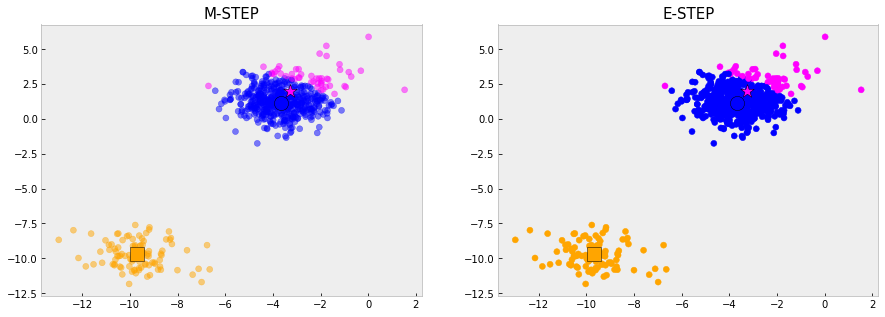

t =  25 : 	 0.10395242839895885
Component:  1 , Pi:  0.19382165033650053 , Mean:  [-3.25814155  2.00539253] , Sigma:  [[1.97269535 0.53301982]
 [0.53301982 1.33692751]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.6422439234339913 , Mean:  [-3.67581966  1.13973007] , Sigma:  [[ 0.91688143 -0.08859552]
 [-0.08859552  0.80252084]]


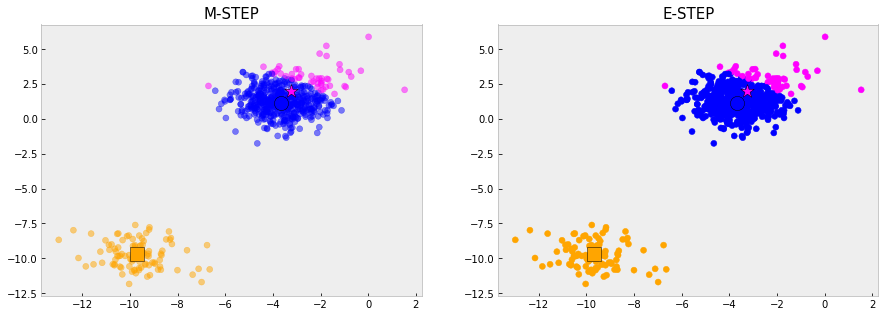

t =  26 : 	 0.10306606642786095
Component:  1 , Pi:  0.18938310908150546 , Mean:  [-3.2390936   2.00081743] , Sigma:  [[1.97562571 0.54554694]
 [0.54554694 1.36014093]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.6466824646889859 , Mean:  [-3.67853116  1.14701143] , Sigma:  [[ 0.91969385 -0.08974   ]
 [-0.08974     0.80679453]]


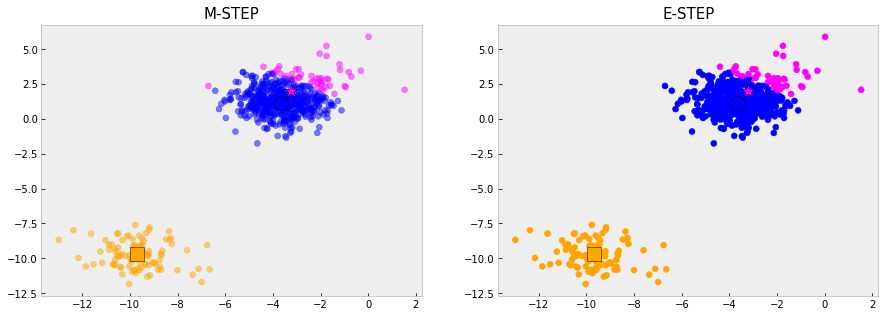

t =  27 : 	 0.10210911751962978
Component:  1 , Pi:  0.18504074488693775 , Mean:  [-3.21976025  1.99626941] , Sigma:  [[1.97759413 0.55837816]
 [0.55837816 1.3836814 ]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.6510248288835542 , Mean:  [-3.68109521  1.15399904] , Sigma:  [[ 0.92252316 -0.09072786]
 [-0.09072786  0.81080953]]


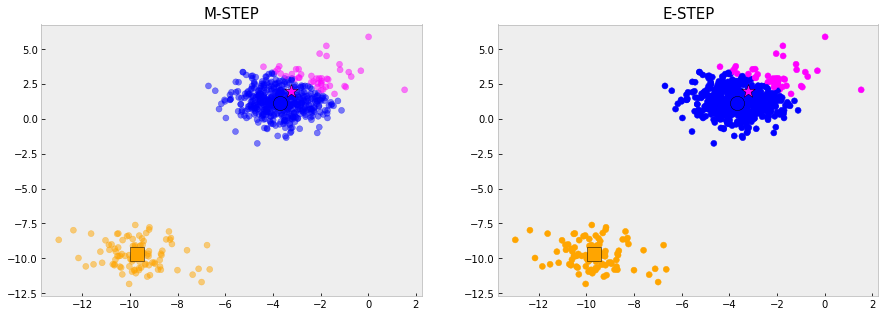

t =  28 : 	 0.1010832675342333
Component:  1 , Pi:  0.1807970352057957 , Mean:  [-3.20015124  1.99175404] , Sigma:  [[1.9785949  0.57148414]
 [0.57148414 1.40754147]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.655268538564696 , Mean:  [-3.68351785  1.16069967] , Sigma:  [[ 0.92535437 -0.09156527]
 [-0.09156527  0.81457888]]


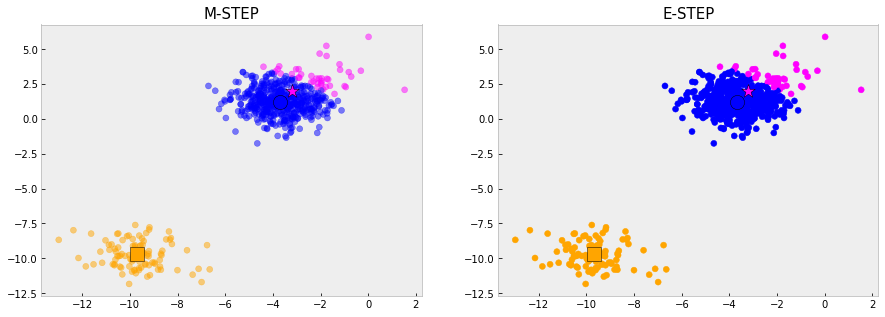

t =  29 : 	 0.09999035957555391
Component:  1 , Pi:  0.17665407614989914 , Mean:  [-3.18027674  1.98727621] , Sigma:  [[1.97862885 0.58483395]
 [0.58483395 1.4317102 ]]
Component:  2 , Pi:  0.16393442622950818 , Mean:  [-9.68941454 -9.71942757] , Sigma:  [[ 1.23626856 -0.1840022 ]
 [-0.1840022   0.89844316]]
Component:  3 , Pi:  0.659411497620593 , Mean:  [-3.68580526  1.16712063] , Sigma:  [[ 0.92817229 -0.09225841]
 [-0.09225841  0.81811612]]


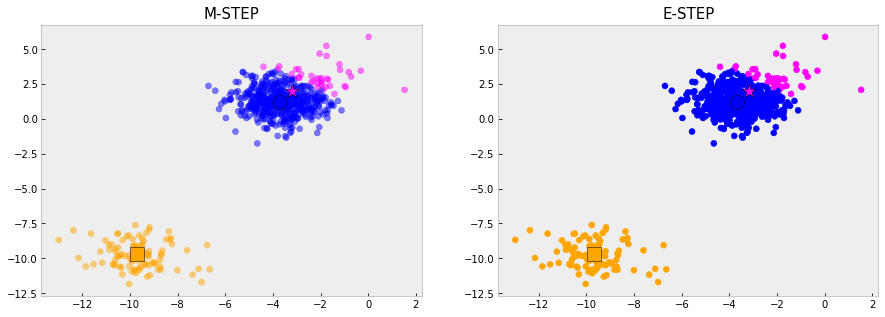

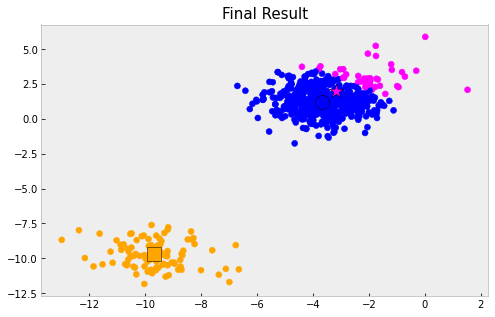

In [62]:
NumComponents = 3
plt.scatter(X6[:,0],X6[:,1],c=colors[T6])
plt.title('Original Data',size=15);plt.show()

EM_Means, EM_Sigs, EM_Ps, pZ_X = EM_GaussianMixture(X6, NumComponents,50,0.1)

___